# Which countries produce the most CO2 per capita?

In [2]:
# load packages
import numpy as np
import pandas as pd
import pprint as pp

import matplotlib.pyplot as plt
%matplotlib inline

# to use seaborn styling in matplotlib plots
import seaborn as sns
sns.set()

# to display offline interactive plots
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# cufflines binds plotly to pandas DFs
import cufflinks as cf
import plotly.tools as tls

tls.embed('https://plot.ly/~cufflinks/8')
cf.set_config_file(offline=True, world_readable=False, theme='ggplot')

## Why look at CO2?

Science has established a causal link to the dramatic spike in greenhouse gas emissions since the industrial revolution, the most significant of which being carbon dioxide, or CO2. 

I'm not here to argue [established fact](https://climate.nasa.gov/evidence/): **this is one case where correlation does indeed imply causation.**

The two plots below speak for themselves. While the scale is different (temperature variations in ° Celsius vs. 1000 metric tonnes), the curve is nearly identical.

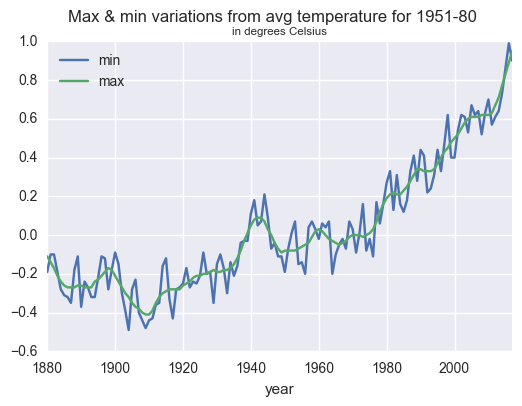

In [3]:
# load historical temperature variation data 

url = 'https://climate.nasa.gov/system/internal_resources/details/original/647_Global_Temperature_Data_File.txt'
temps = pd.read_csv(url, sep= '\t', header=None)

temps.rename(columns={0:'year', 1:'min', 2:'max'}, inplace=True)
temps.set_index('year', inplace=True)

temps.plot()
plt.suptitle('Max & min variations from avg temperature for 1951-80')
plt.title('in degrees Celsius', fontsize='x-small');

From https://climate.nasa.gov/vital-signs/global-temperature/ :

_"This graph illustrates the change in global surface temperature **relative to 1951-1980 average temperatures**. Seventeen of the 18 warmest years in the 136-year record all have occurred since 2001, with the exception of 1998. **The year 2016 ranks as the warmest on record**. (Source: NASA/GISS)."_ (Emphasis mine)

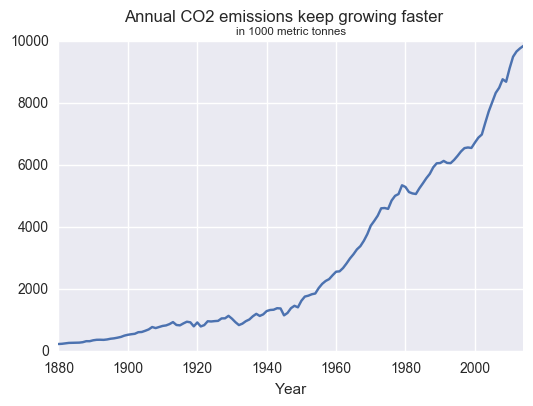

In [4]:
# Compare with global CO2 total *annual* (not cumulative!) emissions

# Global state of CO2
url = 'http://cdiac.ess-dive.lbl.gov/ftp/ndp030/CSV-FILES/global.1751_2014.csv'
df = pd.read_csv(url)\
    .drop(0).iloc[:,0:2]\
    .astype(int).set_index('Year')

# plot same for same timeframe as temp data
df.loc[1880:].plot(legend=False);
plt.suptitle('Annual CO2 emissions keep growing faster')
plt.title('in 1000 metric tonnes', fontsize='x-small');

**Asking questions is more motivating**

This is a depressing and scary subject. I've found lately that I've been avoiding news about climate change, and I've come across so many versions of the plots above that they no longer even register for me. 

So my hope is by asking my own (basic) questions of the data, instead of passively consuming the answers to others', I'll find renewed motivated to reduce my own CO2_pc.

**My questions**

Not being a climate scientist, just a curious person, these are simple:

* Who are the top `CO2_pc` emitters?
* How does this change by continent? 
* Where is `CO2_pc` increasing and decreasing the most?
* What else is changing along with `CO2_pc`? What is happening in the decreasing-emissions countries?


## Load the data
While the previous plot showed global annual CO2 emissions world wide, I will start by analyzing *per capita* CO2 emissions by country and year. 

Later on I'll introduce additional data columns.

**Note about data wrangling**: the csv file used here is the result of merging multiple data sources. It required an INSANE amount of data wrangling. So much so that to include it all here would disrupt the flow of the analysis. Instead, I've documented the process in another notebook, `make_df_nov18.ipynb`.

In [5]:
## Load per capita CO2 data
mypath = 'data/'
filename = 'final_df.csv'

df = pd.read_csv(mypath + filename)

# assign name attribute to df
df.name = filename.split('_')[0]
df.head()

,country,region,sub-region,year,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
0,Afghanistan,Asia,Southern Asia,1949,0.00182,NaN,NaN,NaN,1030.0,NaN,NaN,NaN,NaN
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,NaN,1040.0,NaN,NaN,7752118.0,NaN
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,NaN,1060.0,NaN,NaN,7839426.0,NaN
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,NaN,1070.0,NaN,NaN,7934798.0,NaN
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,NaN,1120.0,NaN,NaN,8038312.0,NaN


In [2997]:
# for now, just focus on annual CO2 & regions columns
val = 'CO2_pc'
co2_df = df.iloc[:,:5]
co2_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 5 columns):
country       17055 non-null object
region        17055 non-null object
sub-region    17055 non-null object
year          17055 non-null int64
CO2_pc        17055 non-null float64
dtypes: float64(1), int64(1), object(3)
memory usage: 666.3+ KB


## About the data

The following variables (columns) were downloaded from Gapminder.

*Pre-1950, based on historical calculations that tabulate coal, brown coal, peat, and crude oil production by nation and year. 1950 onwards, Fossil-Fuel Burning (liquid, gas & solid), Cement Manufacture, and Gas Flaring. http://cdiac.ess-dive.lbl.gov/trends/emis/meth_reg.html*

* `CO2_pc`: Average CO2 emission in metric tons per person during the given year, calculated from converting C to CO2 (C * 3.67), then dividing the total population of the countries.

* `country`: country reporting `CO2_pc` value.

* `year`: year in which the value was reported. 

The following variables I found on github, and merged (painfully) with the CO2 dataset.

*These lists are the result of merging data from two sources, the Wikipedia ISO 3166-1 article for alpha and numeric country codes, and the UN Statistics site for countries' regional, and sub-regional codes. In addition to countries, it includes dependent territories. https://github.com/lukes/ISO-3166-Countries-with-Regional-Codes*

* `region`: Continent the country belongs to. 

* `sub-region`: Lower-level grouping to organizing countries. Membership is strictly based on geography, not cultural affiliations: for example, Mexico is not in North America, but Central America.


## Explore `CO2_pc`

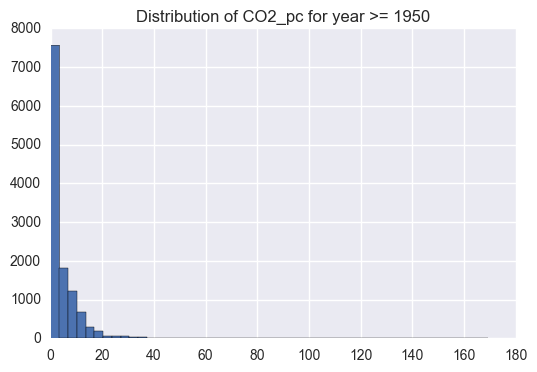

In [2998]:
# CO2 dist since 1950
q = "year >= 1950"

co2_df.query(q)[val].hist(bins=50)
plt.title('Distribution of %s for %s' % (val, q)); 

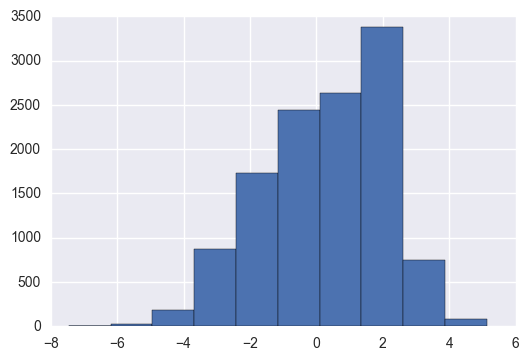

In [2999]:
# log transform this long-tailed data
co2_df.query(q)[val].apply(np.log)\
    .replace([np.inf, -np.inf], np.nan).hist(bins=10);

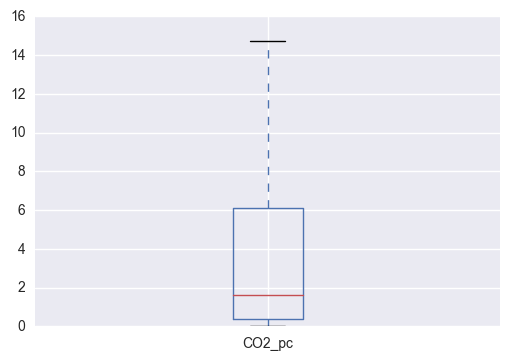

In [3000]:
# boxplot without outliers
co2_df.query(q)[val].plot(kind='box', showfliers = False);

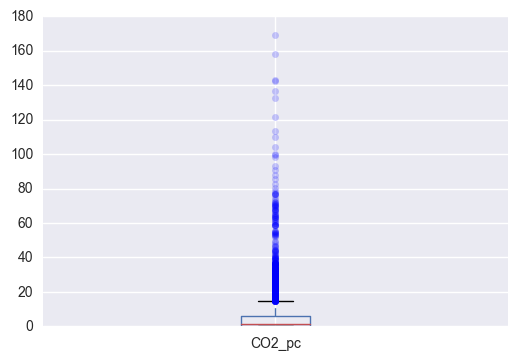

In [3001]:
# boxplot with outliers

# set style for showing outliers
flierprops = dict(marker='o', markersize=5, alpha=0.2)

co2_df.query(q)[val].plot(kind='box', flierprops = flierprops);

There are some extremely high outliers going on here.

In [3002]:
# stats
co2_df.query(q).drop('year', axis=1).describe().round(2)

,CO2_pc
count,12107.00
mean,4.57
std,8.41
min,0.00
25%,0.36
50%,1.61
75%,6.12
max,169.13


### Top & bottom 10 emitters

In [3003]:
# top 10 co2 per cap. emitters for most recent year
max_yr = co2_df['year'].max()
q = "year == @max_yr"

co2_df.query(q)[['country',val, 'sub-region']].sort_values(val, ascending=False).head(10)

,country,CO2_pc,sub-region
12154,Qatar,40.45868,Western Asia
15241,Trinidad And Tobago,34.51710,Caribbean
3729,Cura Ao,34.05183,Caribbean
8443,Kuwait,27.25649,Western Asia
1109,Bahrain,23.68042,Western Asia
2097,Brunei,18.91702,South-Eastern Asia
15662,United Arab Emirates,18.70654,Western Asia
8875,Luxembourg,18.64675,Western Europe
5073,Falkland Is Malvinas,18.06240,South America
12795,Saudi Arabia,17.92586,Western Asia


In [3004]:
# bottom 10 co2 per cap. emitters for most recent year
co2_df.query(q)[['country',val, 'sub-region']].sort_values(val, ascending=False).tail(10)

,country,CO2_pc,sub-region
4947,Ethiopia,0.11245,Eastern Africa
10710,Niger,0.10685,Western Africa
9078,Malawi,0.07859,Eastern Africa
12589,Rwanda,0.07215,Eastern Africa
2869,Central African Republic,0.06305,Middle Africa
9220,Mali,0.06188,Western Africa
13357,Somalia,0.06071,Eastern Africa
2924,Chad,0.04630,Middle Africa
3412,Congo Dem Rep,0.03831,Middle Africa
2340,Burundi,0.02803,Eastern Africa


Top CO2 per capita emitters are either:
* oil-producing countries (no suprise).
* tiny ountries like Luxembourg & Curaçao (surprise).

And while the big emitters can be found across the world, the lowest emitters are all in Africa.

### `CO2_pc` by region

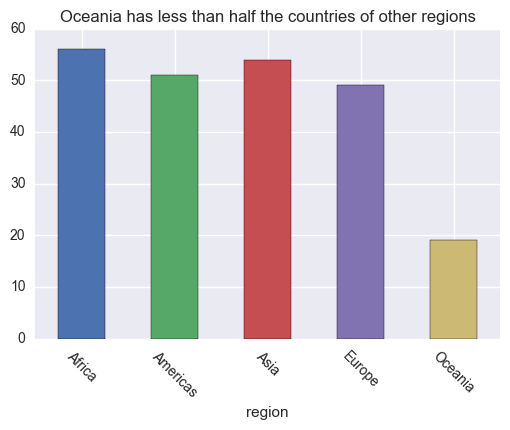

In [3005]:
# How many countries in each region?
co2_df.groupby('region')['country'].nunique().plot(kind='bar', rot=-45)
plt.title('Oceania has less than half the countries of other regions');

In [3006]:
# country counts by region
co2_df.groupby(['region'])['country'].nunique().sort_values()

region
Oceania     19
Europe      49
Americas    51
Asia        54
Africa      56
Name: country, dtype: int64

#### Distributions

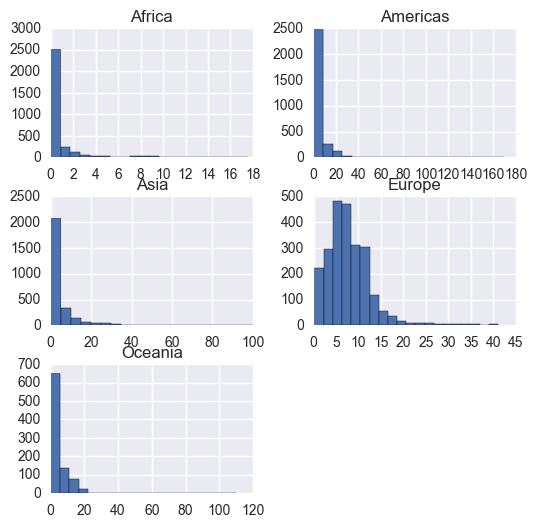

In [3007]:
# dist by region
q = "year >= 1950"
co2_df.query(q).sort_values('region').set_index(['region', 'sub-region','country','year'])\
    .unstack(level=(0))[val]\
    .hist(bins=20, figsize=(6,6));

Interestingly, only Europe has a quasi-normal distribution. Everywhere else has extremely negatively-skewed distributions.

The longest tail appears to be in the Americas, to judge by the x-axis range.

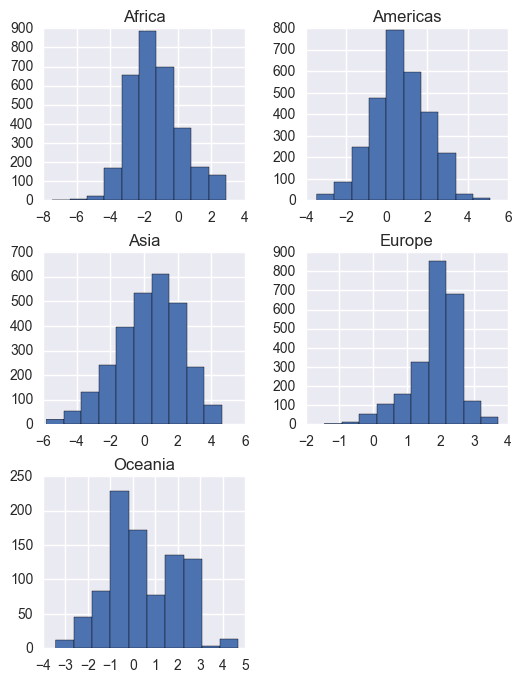

In [3008]:
# apply natural log transform on CO2_pc
log_co2 = co2_df.query(q).sort_values('region').set_index(['region', 'sub-region','country','year'])\
    .unstack(level=0)[val].apply(np.log)
    
# replace numpy infinite values with nans
log_co2.replace([np.inf, -np.inf], np.nan)\
    .hist(bins=10, figsize=(6,8));


The distribution of the log `CO2_pc` values becomes normal except for: 
* Europe, which has a slight positive skew.
* Oceania, which appears to be bi-modal.

#### Where are the outliers?

In [3009]:
## helper function
def make_regional_boxplot(df, facet, showfliers):
    '''facets dataframe and shows boxplot for
    each facet, with title'''
    df.boxplot(by=facet, showfliers = showfliers, flierprops = flierprops, rot=45)
    plt.title(df['region'].unique())
    plt.show();

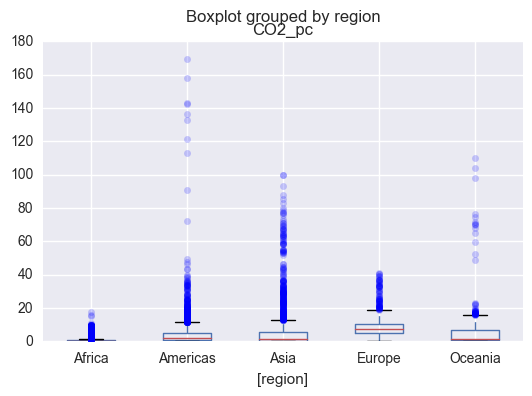

In [3010]:
# boxplots by region
q = "year >= 1950"
co2_df_box = co2_df.query(q).sort_values(['region', 'sub-region'])\
    .set_index(['region', 'sub-region','country','year'])[val].reset_index(level=(0,1))
                                                                        
co2_df_box.boxplot(by='region', flierprops = flierprops);

* Asia seems to have the most outliers, although hard to be certain.
* Americas looks like it's the most extreme.
* Europe seem to have the least-extreme outliers.
* Africa's boxplot looks like it's nearly as tight as Europe's but if the mean is hovering near 0 while the top outlier is nearly 20, then it may be the continent with the most extreme outliers. 

#### Compare IQRs

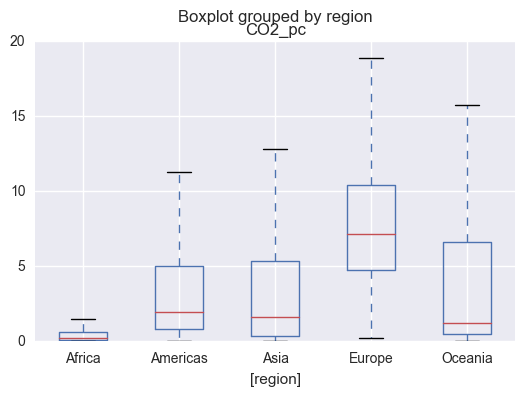

In [3011]:
# Focus on the boxes, hide outliers
co2_df_box.boxplot(by='region', showfliers = False);

#### Variation between regions

In [3012]:
# helper function
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

In [3013]:
## quantify regional variations

q = "year >= 1950"
region_stats = co2_df.query(q).groupby('region').describe()[val]
region_stats.style.apply(highlight_max)

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Africa,3134,0.876144,1.829,0,0.08895,0.226705,0.654475,17.5523
Americas,2901,4.72814,9.57233,0.03153,0.8081,1.96057,5.00944,169.127
Asia,2801,5.55792,11.1381,0,0.35772,1.60469,5.368,99.8314
Europe,2368,7.95614,5.26457,0.23512,4.73499,7.17076,10.4254,41.0319
Oceania,903,4.92194,10.2444,0.0322,0.503925,1.23001,6.61092,109.941


#### Extreme outliers

How many are there, and where?

In [3014]:
# get outlier threshold for each region (3rdQuartile + 1.5 * IQR)
region_stats['outlier_th'] = region_stats.apply(
    lambda region: region['75%'] + 1.5 * (region['75%'] - region['25%']), axis=1)

yr = 1950
outlier_counts = []
outlier_countries = []

for region in co2_df['region'].unique():
    outlier_th = region_stats['outlier_th'].loc[region]
    q = "year >= @yr & region == @region"
    reg_df = co2_df.query(q)
    counts_df = reg_df.loc[reg_df[val] > outlier_th]\
        .groupby(['region']).size()\
        .sort_values()
        
    countries_df = reg_df.loc[reg_df[val] > outlier_th].groupby(['region', 'country']).size()
    outlier_counts.append(counts_df)
    outlier_countries.append(countries_df)

outliers_by_reg = pd.concat(outlier_counts).sort_values()
outliers_by_country = pd.concat(outlier_countries)

In [3015]:
outliers_by_reg

region
Oceania      51
Europe       70
Americas    291
Asia        301
Africa      417
dtype: int64

In [3016]:
outliers_by_country # based on region IQR, not sub-region's (which is often higher)

region    country              
Asia      Bahrain                  43
          Brunei                   36
          Kazakhstan                7
          Kuwait                   54
          Mongolia                  1
          Oman                      9
          Qatar                    55
          Saudi Arabia             35
          Singapore                16
          United Arab Emirates     45
Europe    East Germany             11
          Luxembourg               59
Africa    Algeria                  42
          Botswana                 24
          Egypt                    20
          Equatorial Guinea        13
          Gabon                    47
          Libya                    47
          Mauritania                2
          Mauritius                21
          Morocco                   9
          Namibia                   1
          Reunion                  35
          Seychelles               30
          South Africa             64
          St Helen

##### Observations

I still get the impression that there is a disproportionate number of tiny countries among the outlier countries in the Americas (such as St Pierre et Miquelon and the Falklands) and Europe (Luxembourg, again), possibly Africa too.

It might be worthwile looking at population or surface area to see if there's a negative correlation with `CO2_pc`.

Note that while tiny countries are among Oceania's outliers, that's less surprising: aside from Australia, virtually all countries in this region are very small.

##### Compare Outliers & IQRS within each region


In [3017]:
## helper functions

def assign_name(row):
    df = row['df']
    df.name = row['labels']
    
def facetize_df(df, facet):
    """
    Splits df into list of smaller dfs for each categorical value
    """
    facet_dfs = [df.loc[df[facet]==f] for f in df[facet].unique()]
    facet_list = [f for f in df[facet].unique()]
    
    facet_dfs = pd.DataFrame({'df': facet_dfs, 'labels': facet_list})
    
    #facet_dfs = facet_dfs.apply(assign_name, axis=1)
    return facet_dfs


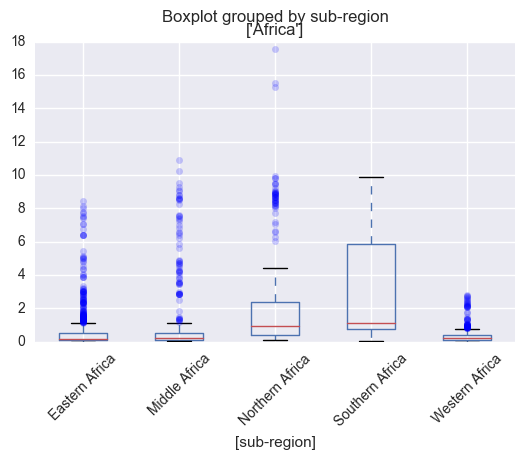

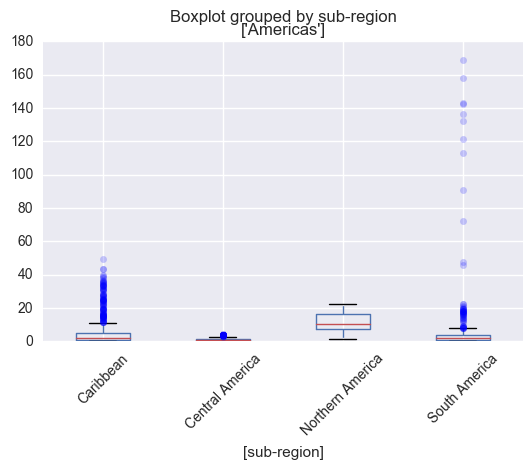

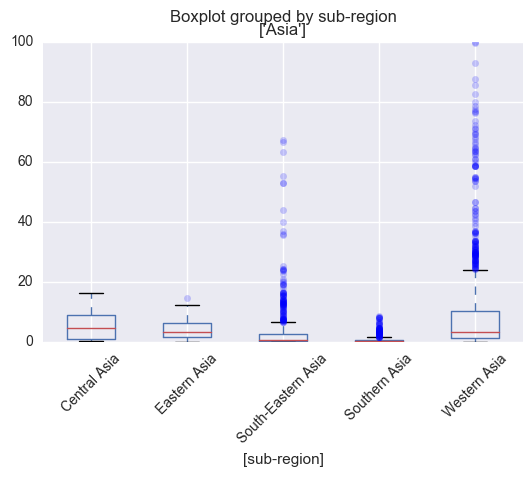

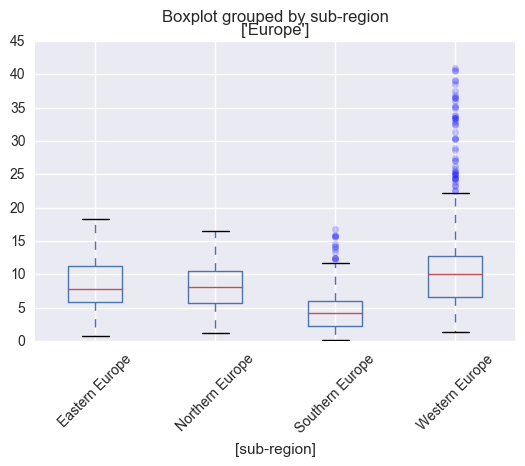

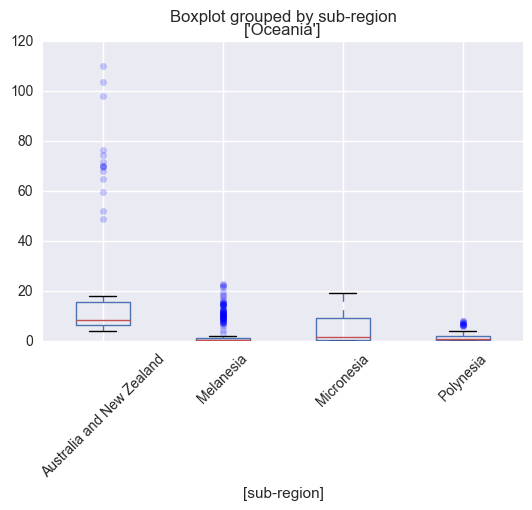

0    None
1    None
2    None
3    None
4    None
Name: df, dtype: object

In [3018]:
# boxplots by region & sub-region

# split reshaped into smaller regional co2_df's
regions_co2_dfs = facetize_df(co2_df_box, 'region')
showfliers=True

regions_co2_dfs['df'].apply(make_regional_boxplot, args=['sub-region', showfliers])

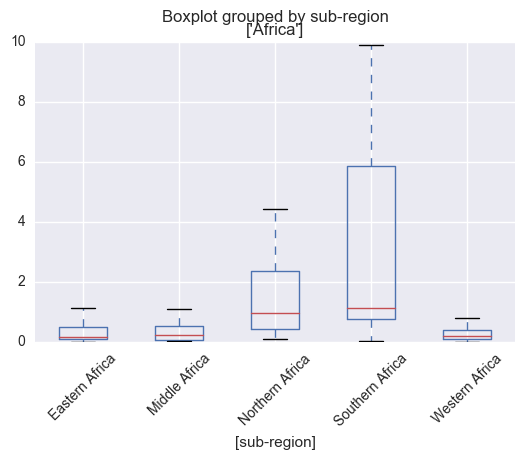

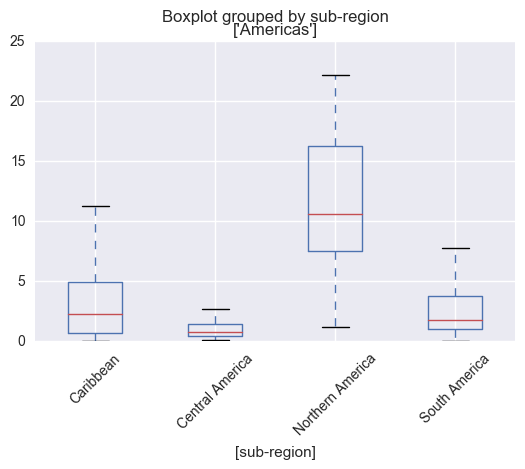

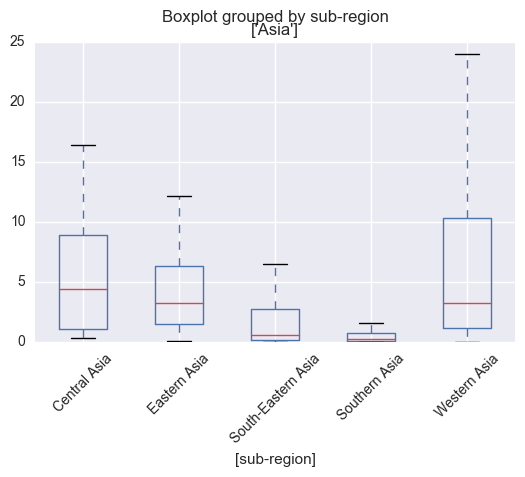

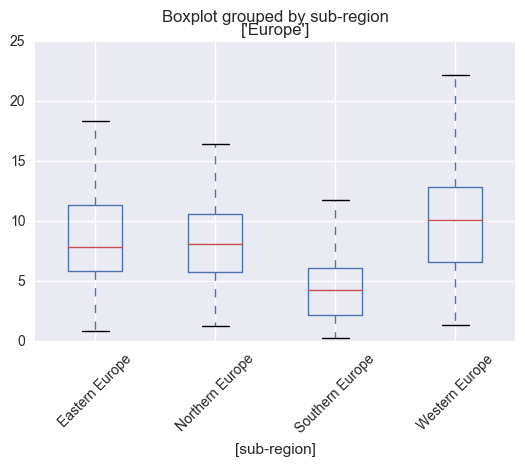

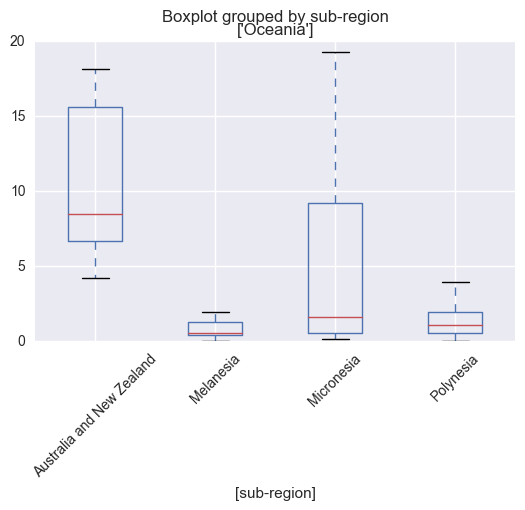

0    None
1    None
2    None
3    None
4    None
Name: df, dtype: object

In [3019]:
# same boxplots without outliers
showfliers = False
regions_co2_dfs['df'].apply(make_regional_boxplot, args=['sub-region', showfliers])

##### How much variance is there between regions?

While it's hard to tell which region has the _most_ variation between sub-regions, Europe seems to have the least. 

Americas and Oceania I suspect have the most, based on the differences in position & shape of the IQR boxes for their respective sub-regions.


In [3020]:
# which region is most homogenous, i.e.
# has lowest coefficient of variance?

(region_stats['std']/region_stats['mean']).sort_values().round(2)

region
Europe      0.66
Asia        2.00
Americas    2.02
Oceania     2.08
Africa      2.09
dtype: float64

### `CO2_pc`  over time

How have carbon emissions changed over time?
#### Plot means & medians

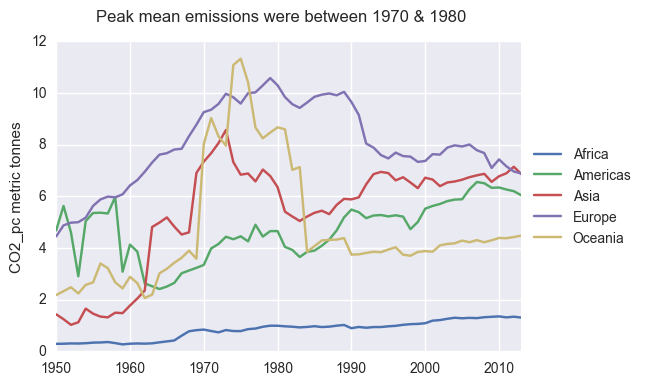

In [3021]:
# mean CO2 by year & region
q = 'year >= 1950'
region_year = pd.DataFrame(co2_df.query(q).groupby(['year', 'region']).mean())[val]
region_year.unstack().plot();

plt.ylabel('%s metric tonnes' % val)
plt.xlabel('')
plt.suptitle("Peak mean emissions were between 1970 & 1980")
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

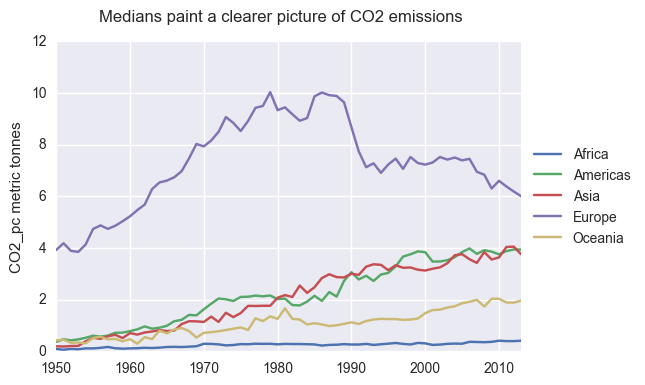

In [3022]:
# median CO2 by year & region
region_year = pd.DataFrame(co2_df.query(q).groupby(['year', 'region']).median())[val]
region_year.unstack().plot()

plt.ylabel('%s metric tonnes' % val)
plt.xlabel('')
plt.suptitle("Medians paint a clearer picture of CO2 emissions", fontsize='medium', linespacing=10)
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

##### Observations

Europe remains the CO2 emissions gorilla. 

After steady growth between 1950 to 1980, European emissions wobbled in the 80s, then fell off a cliff around 1990. Emissions plateaued (now at late 60's levels) until around 2005, whereupon they steadily decreased.

By contrast, Asia, the Americas, and to a lesser extent Oceania have seen median CO2 emissions creep steadily upwards for the entire timeframe. You can almost imagine Asia & Amercia's curves converging with Europe's in a decade or so.

At the bottom of the medians plot, African emissions initially appear to be virtually flat, but they are increasing too. But Africa's baseline is so much lower in the first place that its CO2 growth is dwarfed by that of other regions.

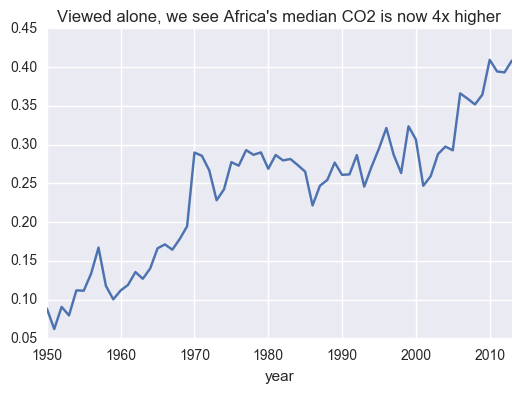

In [3023]:
# show median Africa on its own
region_year.unstack()['Africa'].plot()
plt.title("Viewed alone, we see Africa's median CO2 is now 4x higher");


#### % change since 1950

Here we'll quantify the percentage change in median CO2 emssions for time period `q`.

In [3024]:
# create df of start & end year medians
start = region_year.unstack().index.min()
end = region_year.unstack().index.max()
region_year.unstack().loc[[start, end]]

# show % change of median value since beginning of time frame
change = region_year.unstack().loc[[start, end], ].pct_change()
change.sort_values(2013, axis=1)\
    .multiply(100).round()\
    .dropna(how='all')


region,Europe,Africa,Oceania,Americas,Asia
year,,,,,
2013,53.0,361.0,369.0,980.0,1833.0


Wow. Usually plots are more eye-opening than numbers, but in this case it's the reverse.

#### Zoom in on Europe

Why focus on Europe? 

* As home of the modern era's original superpowers, it has contributed the most to cumulative CO2 emissions. 
* For the 1950-2013 timeframe, Europe has the most homoegenous emission rates across sub-regions (measured by the coefficient of variation in mean `CO2_pc`)
* Unlike the other continents, median emissions have decreased dramatically since the mid-80s.
* Last but not least, it's been my home for the past 10 years (I'm Canadian but live in France).

##### Overview Plots

In [3025]:
# create europe CO2 df
q = "region=='Europe' & year >= 1950"
co2_eur_df = co2_df.query(q).loc[co2_df['region']=='Europe'].copy().reset_index(drop=True)

# assign name attribute for use in plot titles
co2_eur_df.name = 'Europe CO2'


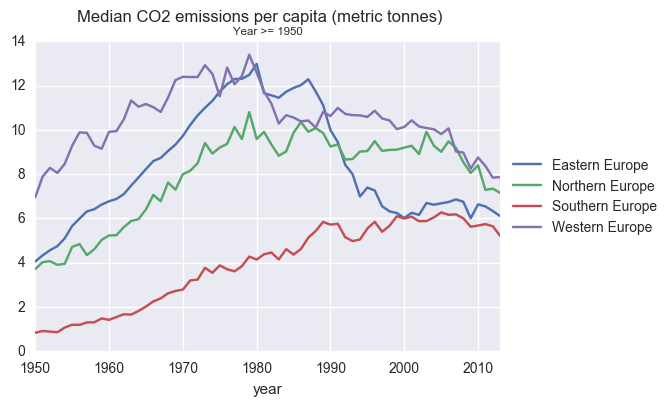

In [3026]:
# create df of sub-region medians
q = "year >= 1950"
val = 'CO2_pc'
eur_medians = co2_eur_df.query(q).groupby(['year','region', 'sub-region'])[val].median().unstack()
eur_medians.reset_index('region').plot()

# plot
plt.suptitle('Median CO2 emissions per capita (metric tonnes)')
plt.title(str.title(q), fontsize='x-small')
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

##### Mind the (decreasing) gap

Convergence! Since 1950, median `CO2_pc` in Western Europe has fallen enough while Southern Europe's has increased so that the gap has been cut in more than half.

In [3027]:
# diff by sub-region for start & end medians
start = co2_eur_df['year'].min()
end = co2_eur_df['year'].max()

start_end = eur_medians.loc[[start, end]]
start_end

,sub-region,Eastern Europe,Northern Europe,Southern Europe,Western Europe
year,region,,,,
1950,Europe,4.05544,3.71689,0.838790,6.95334
2013,Europe,6.10787,7.15232,5.211765,7.87299


In [3028]:
# % change by sub-region
start_end.pct_change().multiply(100).round(2).drop(start)

,sub-region,Eastern Europe,Northern Europe,Southern Europe,Western Europe
year,region,,,,
2013,Europe,50.61,92.43,521.34,13.23


In [3029]:
# change in the gap between top & bottom sub-regions
start_end.max(axis=1).subtract(start_end.min(axis=1))

year  region
1950  Europe    6.114550
2013  Europe    2.661225
dtype: float64

#### Remove duplicate data

While data cleaning and looking at outliers, I noticed the splitting off of countries after the fall of the Soviet Union creates potential duplicate data. As European `CO2_pc` values tend to be much higher than anywhere else, duplicate values here can distort results.

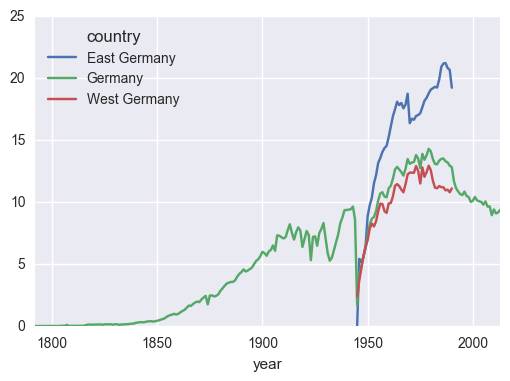

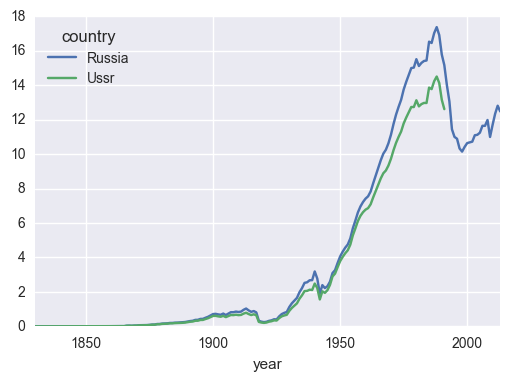

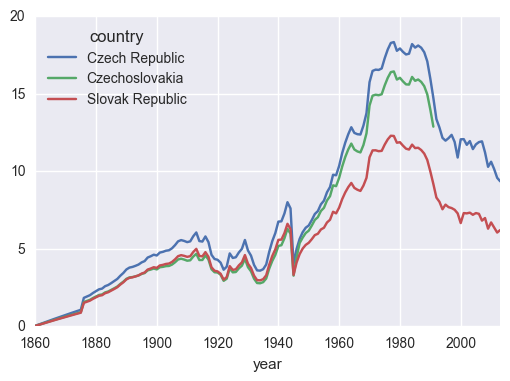

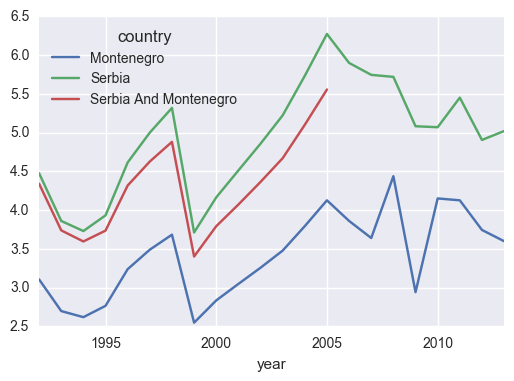

In [3030]:
# verify if these countries share time periods
germs = ['East Germany', 'West Germany', 'Germany']
sov = ['Russia', 'USSR']
czech = ['Czechoslovakia', 'Czech Republic', 'Slovak Republic']
serb = ['Serbia', 'Serbia And Montenegro', 'Montenegro']

all_dupes = [germs, sov, czech, serb]
all_dupes = [[word.lower() for word in lst] for lst in all_dupes] 

# compare on time series plot
pd.Series(all_dupes).apply(
    lambda l: co2_df.loc[co2_df['country'].str.lower().isin(l)]
    .pivot('year', 'country', val)
    .plot()
);

Indeed, the rows overlap. Let's drop the Soviet-era countries.

How much difference will this make?

In [3032]:
# Remove countries that no longer exist.
# Their data is already captured by the new country name.
drop_dupes = ['East Germany', 'West Germany', 'Ussr', 'Czechoslovakia', 'Serbia And Montenegro']
drop_index = co2_df.query(q).loc[co2_df.query(q)['country'].isin(drop_dupes)].index

q = "region == 'Europe' & year >= 1950"

# before, with overlapping countries
co2_eur_orig = co2_eur_df.query(q).groupby('sub-region').describe()[val]

# after dropping the redundant countriex
co2_eur_dedupe = co2_df.query(q).drop(drop_index).query(q).groupby('sub-region').describe()[val]

In [3033]:
# what's the difference?
co2_eur_dedupe - co2_eur_orig

,count,mean,std,min,25%,50%,75%,max
sub-region,,,,,,,,
Eastern Europe,-84.0,-0.433609,-0.123709,0.0,-0.18306,-0.35272,-0.915957,0.0
Northern Europe,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.000000,0.0
Southern Europe,-14.0,0.002366,0.028553,0.0,-0.03873,-0.02286,0.028130,0.0
Western Europe,-82.0,-0.411092,0.414775,0.0,-0.31471,-0.67570,-0.938580,0.0


In [3034]:
# fix this in original df
co2_df = co2_df.drop(drop_index)

#### Interactive time-series

In [3035]:
## helper functions

def plotly_line2(df, val):
    name = df.name
    df = df.pivot('year', 'country', val)
    fig = df.iplot(asFigure = True,\
                    title = " ".join([val,name]),\
                    yTitle = str.title('%s in metric tonnes' % val),\
                    theme = 'ggplot')
    
    return fig

def plotly_timeseries(df, value):
    fig = plotly_line2(df, value)
    py.offline.iplot(fig)
    
    
def plot_facet_timeseries(df, facet, val):
    #df_list = facetize_df(df, facet)
    #pd.Series(df_list).apply(plotly_timeseries, args=[val])
    for f in df[facet].unique():
        facet_df = df.loc[df[facet]==f]
        facet_df.name = f
        plotly_timeseries(facet_df, val)

In [3036]:
# look at timeseries once more with de-duped data
q = "year >= 1950 & region == 'Europe'"
val = 'CO2_pc'

# create spaghetti plots for each sub-region
for reg in co2_df.query(q)['region'].unique():
    reg_df = co2_df.query(q).loc[co2_df['region']==reg]

    plot_facet_timeseries(reg_df, 'sub-region', val)

##### Observations

* Virtually all countries have been trending down the last few years, except Gibraltar, Norway and Estonia.

* The `CO2_pc` lines for countries in both E. Europe & W. Europe (after filtering out Luxembourg) are virtually parallel. I suspect this is an indicator of the interconnectedness of the economies of each of these sub-regions, and consequently that of their energy consumption.

* The trajectories in S. Europe were noisier, and downright erratic in N. Europe. Similarly, I believe this is due to these regions being more heterogeneous collections of countries, with less interdependent economies.

* Once more, it's the tiny countries that have the highest emissions, at least at the sub-region level. Examples are Luxembourg (a regional outlier), Faroe Islands & Estonia, and Gibraltar.

* Sweden's `CO2_pc` has decreased so much since the late 70s that it is almost back to its 1950 level.

What prompted the CO2 declines of recent years?

Two things come to mind: 
* after 3 years of negotiating targets, 2008 marked the start of Phase 1 implementation for the Kyoto Protocol (Phase 1 ended in 2012)
* in the 2nd half of 2008 the global financial crash (Great Recession) began.

#### Compare with rest of world

The ranges are so much larger in other regions, we'll need to use log scale.

In [3037]:
# compare with other regions

# look at timeseries once more with de-duped data
q = "year >= 1950 & region != 'Europe'"
val = 'CO2_pc'
# convert to log scale
log_co2_df = co2_df.copy()
log_co2_df[val] = log_co2_df[val].apply(np.log)
log_co2_df.rename(columns={'CO2_pc': 'log_CO2_pc'}, inplace=True)

In [3038]:
val = 'log_CO2_pc' # used for plot title

for reg in log_co2_df.query(q)['region'].unique():
    reg_df = log_co2_df.query(q).loc[log_co2_df['region']==reg]
    plot_facet_timeseries(reg_df, 'sub-region', val)

#### Observations

In general, less cohesive than Europe. Americas does have some of the parallel trendlines seen in E & W Europe. Again, reflection of close economic ties within sub-region, and perhaps with Europe itself?

An exception in the Amercias is the chaotic Caribbean, which perhaps not coincidentally is amost exclusively of the type of tiny countries that often have outliers.

The key different of course between any of these sub-regions and Europe's is the scale: Europe was linear, these are log.

## Multi-variate analysis

Here I will look at 8 additional variables. Per capita energy consumption, production, and income (GDP) I expect will have strong correlations, but am curious how that may vary by country or region. 

The remaining variables I chose to simply get a broader characteristics of a country, such as the level of inequality or how far up they are on the 'Human Development Index'.

### About the additional data

All data was downloaded from the Gapminder website.

* `energy-use_pc` (kWh): Energy use refers to use of primary energy before transformation to other end-use fuels, which is equal to indigenous production plus imports and stock changes, minus exports and fuels supplied to ships and aircraft engaged in international transport. From [Electricity use, per person](https://docs.google.com/spreadsheets/d/1nm__JKA7p85YTEV-LCtREdR8QNc-oi0TgjJFFTNupgU/pub?range=A1:D70&gid=1&output=html#).


* `energy-production_pc` (tonnes of oil equivalent) From [Energy production, per person (toe)](https://docs.google.com/spreadsheets/d/1Kze_MKuTFaw3_BO_fgte2kQaGV54rq873o_KzyM7Kyk/pub?range=A1:D70&gid=1&output=html#). 


* `hdi`: A composite index measuring average ability to lead a long and healthy life,
measured by life expectancy at birth; the ability to acquire
knowledge, measured by mean years of schooling
and expected years of schooling; and the ability to
achieve a decent standard of living, measured by gross
national income per capita. See Technical note 1 at http://hdr.undp.org/. From [HDI (Human Development Index)](https://docs.google.com/spreadsheets/d/178j02780CUiRqZOmc6Eybg9YwEH4LRddQ68afSZo4ak/pub?range=A1:D70&gid=1&output=html#)


* `income_pc`: GDP per capita measures the value of everything produced in a country during a year, divided by the number of people. The unit is in international dollars, fixed 2011 prices. The data is adjusted for inflation and differences in the cost of living between countries, so-called PPP dollars. From [Income per person (GDP/per capita, PPPdollars inflation-adjusted)](https://github.com/Gapminder-Indicators/gdppc_cppp/raw/master/gdppc_cppp-by-gapminder.xlsx)


* `population`: We use UN population data between 1950 to 2100 from UN Population Division World Population Prospects 2017 and the forecast to year 2100 is using their medium fertility variant. For years before 1950, this version uses the data documented in greater detail by Mattias Lindgren in version 3 below. The main source there was Angus Maddison’s data which is maintained and improved by CLIO Infra Project. From [Population, total](https://www.gapminder.org/data/documentation/gd003/).


* `gini_idx`: A measure from 0 to 100, where 0 represents perfect equality. On Gapminder: [GINI Index](https://docs.google.com/spreadsheets/d/1Iztdl7Ddaz77K3HheGpkvQ1o_ui_L1s-sze_ZpTM0F0/pub?range=A1:D70&gid=1&output=html#).


* `military_%gdp` From [Military expenditure (% of GDP)](https://docs.google.com/spreadsheets/d/1HXH3ncdQLFpOXVNdC2nkPCSGz_perkfPcBeU1e2HF24/pub?range=A1:D70&gid=1&output=html#)


* `gas_price_liter` From [Pump price for gasoline (US$ per liter)](https://docs.google.com/spreadsheets/d/1s54748oSGemV3pFVKBpyTKkhucu2ojLQ6AmexHNtdO4/pub?range=A1:D70&gid=1&output=html#)



### Load data

**Note about data wrangling**: the csv file used here is the result of merging multiple data sources. It required an INSANE amount of data wrangling. So much so that to include it all here would disrupt the flow of the analysis. Instead, I've documented the process in another notebook, `make_df_nov18.ipynb`.

In [3072]:
# expand DF to include all columns
df = pd.read_csv(mypath + 'final_df.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                 17055 non-null object
region                  17055 non-null object
sub-region              17055 non-null object
year                    17055 non-null int64
CO2_pc                  17055 non-null float64
energy_use_pc           5324 non-null float64
energy_production_pc    5978 non-null float64
hdi                     3898 non-null float64
income_pc               14969 non-null float64
gini_idx                5281 non-null float64
military_%gdp           8016 non-null float64
population              12517 non-null float64
gas_price_liter         3995 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.7+ MB


In [3040]:
# drop duplicate countries as per Zoom-in on Europe section
drop_index = df.loc[df['country'].isin(drop_dupes)].index
df = df.drop(drop_index)

# rename energy columns
df.rename(columns={'energy_use_pc':'energy-use_pc', 'energy_production_pc':'energy-prod_pc'}, inplace=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16677 entries, 0 to 17054
Data columns (total 13 columns):
country            16677 non-null object
region             16677 non-null object
sub-region         16677 non-null object
year               16677 non-null int64
CO2_pc             16677 non-null float64
energy-use_pc      5324 non-null float64
energy-prod_pc     5978 non-null float64
hdi                3898 non-null float64
income_pc          14969 non-null float64
gini_idx           5281 non-null float64
military_%gdp      8016 non-null float64
population         12337 non-null float64
gas_price_liter    3995 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


There's a lot of null values in these new columns

### Explore the data

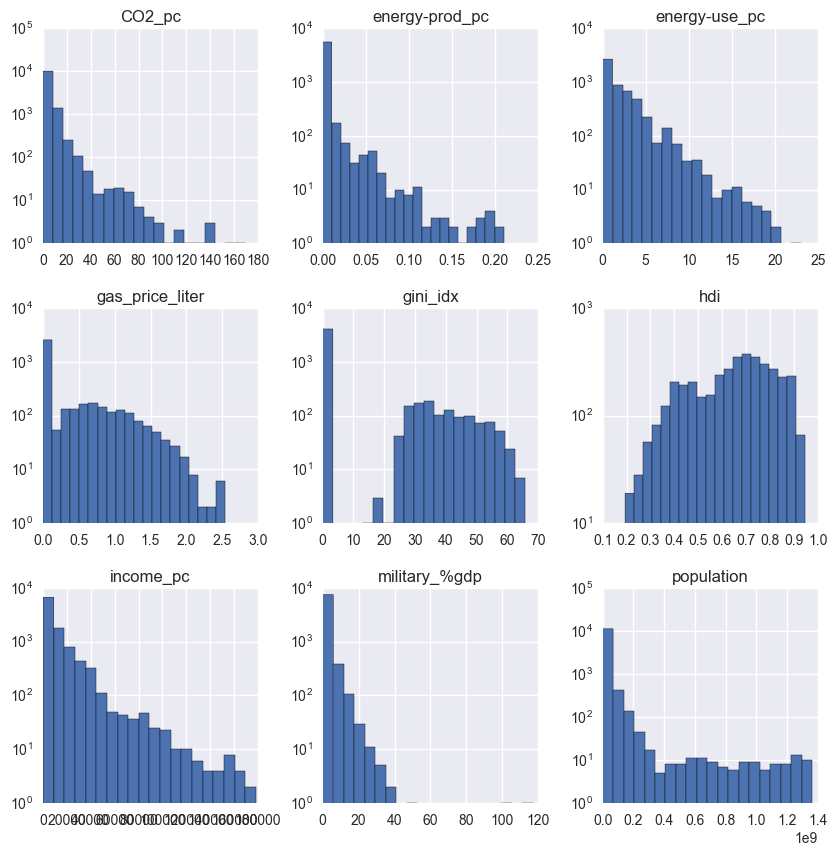

In [3041]:
# plot with log y-axis
q = "year >= 1950"
df.query(q).drop(['year'], axis=1)\
    .hist(figsize=(10,10), log=True, bins=20); 

In [3042]:
# stats
df.query(q).describe().round(2)

,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
count,11927.00,11927.00,5324.00,5978.00,3898.00,10443.00,5281.00,8016.00,1.191000e+04,3995.00
mean,1983.69,4.46,2.21,0.00,0.64,11380.27,9.07,2.18,2.456421e+07,0.32
std,18.23,8.41,2.57,0.02,0.17,16703.63,17.28,3.42,9.878111e+07,0.51
min,1950.00,0.00,0.01,0.00,0.19,247.00,0.00,0.00,1.072000e+03,0.00
25%,1968.00,0.35,0.52,0.00,0.51,2030.00,0.00,0.00,4.839058e+05,0.00
50%,1985.00,1.55,1.17,0.00,0.67,5250.00,0.00,1.47,4.515785e+06,0.00
75%,2000.00,5.92,3.03,0.00,0.77,13700.00,0.00,2.74,1.446561e+07,0.61
max,2013.00,169.13,23.07,0.21,0.94,178000.00,65.80,117.00,1.362514e+09,2.54


There also seems to be a lot of zeros.

In [3043]:
# Which columns contain 0 values?
nonzero = df.set_index(['country', 'year'])!=0.

df.set_index(['country', 'year']).mask(nonzero).count()

region                0
sub-region            0
CO2_pc               62
energy-use_pc         0
energy-prod_pc     1069
hdi                   0
income_pc             0
gini_idx           4070
military_%gdp      2015
population            0
gas_price_liter    2519
dtype: int64

#### Replace zeros with NaNs

There seems to be a lot of zero values here that should actually be NaNs. For example, I truly doubt the price of gas anywhere, at anytime, was 0. Nor can I believe that war-torn Afghanistan spent 0% of GDP on the military during the 60s,70s, and 80s! 

Similarly, the gini inequality index has a scale of 0-100, where 0 = perfect equality. While feasible, it seems extremely unlikely that so many countries achieved such a Utopian state?

I'm going to assume these 0s should be NaN.

In [3044]:
# replace 0.0 vals with NaNs
df.replace(0., np.nan, inplace = True)

# verify
df.set_index(['country', 'year']).mask(nonzero).count()

region             0
sub-region         0
CO2_pc             0
energy-use_pc      0
energy-prod_pc     0
hdi                0
income_pc          0
gini_idx           0
military_%gdp      0
population         0
gas_price_liter    0
dtype: int64

In [3045]:
# we should see even fewer non-null values now
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16677 entries, 0 to 17054
Data columns (total 13 columns):
country            16677 non-null object
region             16677 non-null object
sub-region         16677 non-null object
year               16677 non-null int64
CO2_pc             16615 non-null float64
energy-use_pc      5324 non-null float64
energy-prod_pc     4909 non-null float64
hdi                3898 non-null float64
income_pc          14969 non-null float64
gini_idx           1211 non-null float64
military_%gdp      6001 non-null float64
population         12337 non-null float64
gas_price_liter    1476 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


#### Now, fill those NaNs

Now it's time to fill some NaNs. I'd like to use interpolation, filling in NaNs that fall between two valid values. 

For this I'll create a new dataframe, with data from 1950 onwards.

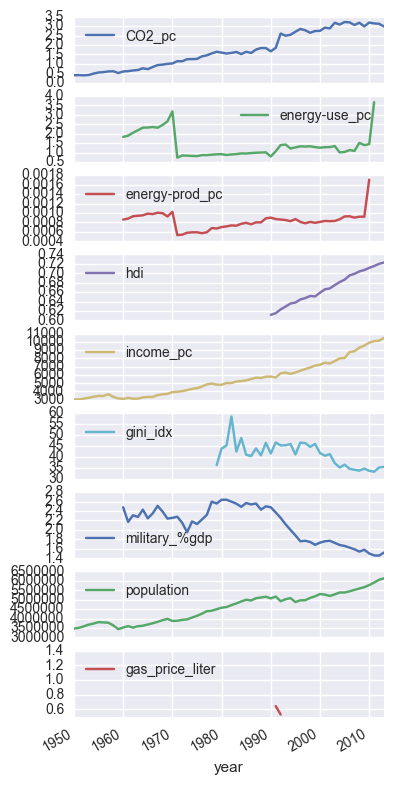

In [3046]:
# sanity check: plot medians before interpolation
index = ['region', 'sub-region', 'country']
q = "year >= 1950"
df.query(q).groupby('year').median().plot(subplots=True, figsize = (4,10));

More or less. The sharp drop for the `energy` columns is understandable given happened in the early 70s, when there was the OPEC oil crisis.

And what's going on with gas price?

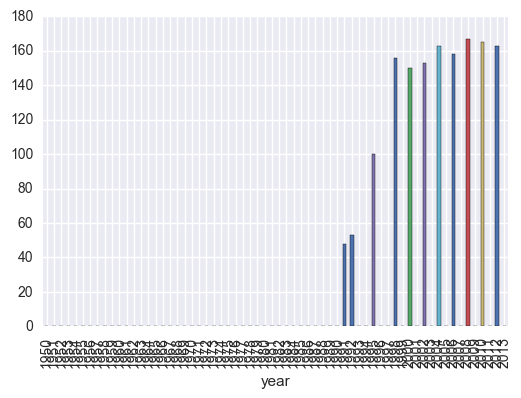

In [3047]:
# how many values are there for gas price?
q = "year >= 1950"
df.query(q).groupby('year')['gas_price_liter'].count().plot(kind='bar');

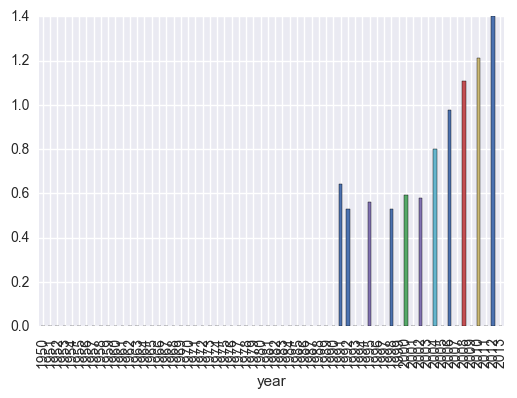

In [3048]:
# and are there some really low values that were hidden from the earlier plot?
df.query(q).groupby('year')['gas_price_liter'].median().plot(kind='bar');

Well, there is data there. I'm puzzled why the `gas` subplot was so truncated, then. Perhaps the data is just too sparse.

In [3049]:
# interpolate missing data when it's between 2 valid data points. 
# use .transform() to interpolate country by country!

q = "year >= 1950"
df_imputed = df.set_index('country').query(q).groupby('country').transform(
    lambda x: x.interpolate(method='linear',
                            limit_area='inside')).reset_index()



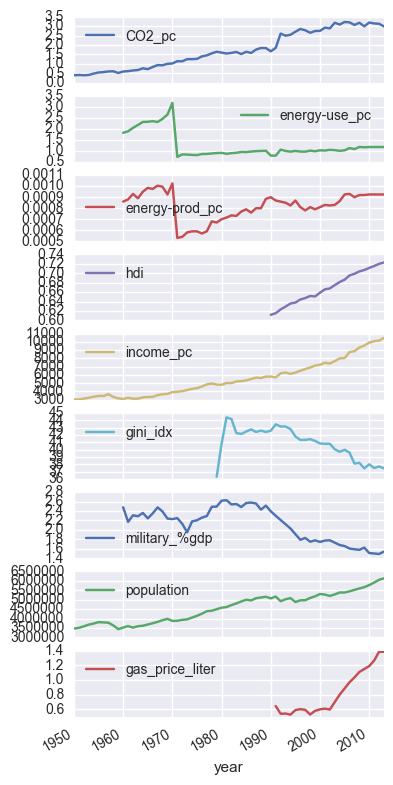

In [3050]:
# sanity check: do the medians look realistic?
df_imputed.groupby('year').median().plot(subplots=True, figsize = (4,10));

##### The dangers of interpolation
The first time I used interpolate, I forgot that the data was in long format. This means that it would interpolate the entire column, rather than for each country within the column. 

I realized my mistake when I looked created the same plot above, and saw that `gini_idx` and `gas_price_liter` suddenly had data starting from 1950, and the medians for all columns had been suspiciously smoothed-out.

In [3051]:
# sanity check: Canada before
q = "year >=1980" # first gini val for Canada was in 1981
df.query(q).loc[df.query(q)['country']=='Canada'].head()

,country,region,sub-region,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
2659,Canada,Americas,Northern America,1980,18.07789,7.831854,0.00846,NaN,26800.0,NaN,1.73,24515788.0,NaN
2660,Canada,Americas,Northern America,1981,17.35930,7.542271,0.00810,NaN,27300.0,32.4,1.68,24768525.0,NaN
2661,Canada,Americas,Northern America,1982,16.57933,7.160591,0.00810,NaN,26100.0,NaN,1.92,25017501.0,NaN
2662,Canada,Americas,Northern America,1983,16.16965,7.052768,0.00820,NaN,26600.0,NaN,2.04,25272656.0,NaN
2663,Canada,Americas,Northern America,1984,16.65798,7.342138,0.00896,NaN,27900.0,NaN,2.07,25546736.0,NaN


In [3052]:
# sanity check: Canada after (1980 gini should still be NaN)
q = "year >=1980" 
df_imputed.query(q).loc[df_imputed.query(q)['country']=='Canada'].head()

,country,region,sub-region,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
1816,Canada,Americas,Northern America,1980,18.07789,7.831854,0.00846,NaN,26800.0,NaN,1.73,24515788.0,NaN
1817,Canada,Americas,Northern America,1981,17.35930,7.542271,0.00810,NaN,27300.0,32.40,1.68,24768525.0,NaN
1818,Canada,Americas,Northern America,1982,16.57933,7.160591,0.00810,NaN,26100.0,32.25,1.92,25017501.0,NaN
1819,Canada,Americas,Northern America,1983,16.16965,7.052768,0.00820,NaN,26600.0,32.10,2.04,25272656.0,NaN
1820,Canada,Americas,Northern America,1984,16.65798,7.342138,0.00896,NaN,27900.0,31.95,2.07,25546736.0,NaN


In [3053]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11927 entries, 0 to 11926
Data columns (total 13 columns):
country            11927 non-null object
region             11927 non-null object
sub-region         11927 non-null object
year               11927 non-null int64
CO2_pc             11926 non-null float64
energy-use_pc      6254 non-null float64
energy-prod_pc     5404 non-null float64
hdi                3898 non-null float64
income_pc          10443 non-null float64
gini_idx           2853 non-null float64
military_%gdp      6423 non-null float64
population         11910 non-null float64
gas_price_liter    3201 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.2+ MB


In [3054]:
# now let's run the stats again
q = "year >= 1950"
df_imputed.query(q).drop('year', axis=1).describe().round(2)

,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
count,11926.00,6254.00,5404.00,3898.00,10443.00,2853.00,6423.00,1.191000e+04,3201.00
mean,4.46,2.09,0.01,0.64,11380.27,40.69,2.99,2.456421e+07,0.88
std,8.41,2.53,0.02,0.17,16703.63,8.99,4.22,9.878111e+07,0.46
min,0.00,0.01,0.00,0.19,247.00,16.20,0.00,1.072000e+03,0.02
25%,0.35,0.48,0.00,0.51,2030.00,33.60,1.26,4.839058e+05,0.53
50%,1.55,1.02,0.00,0.67,5250.00,40.30,2.02,4.515785e+06,0.81
75%,5.92,2.81,0.00,0.77,13700.00,46.42,3.30,1.446561e+07,1.17
max,169.13,23.07,0.21,0.94,178000.00,65.80,117.00,1.362514e+09,2.54


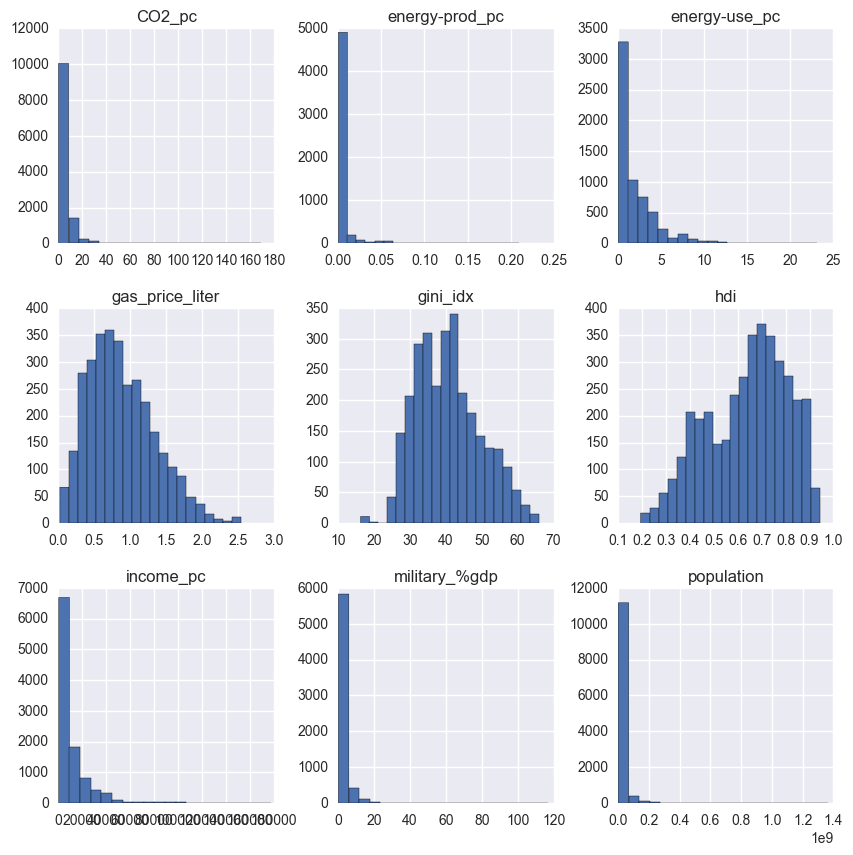

In [3055]:
# look at histograms again
df_imputed.drop(['year'], axis=1)\
    .hist(figsize=(10,10), bins=20); 

In [3056]:
# have correlations changed?
val = 'CO2_pc'
# BEFORE
corr_df[val].sort_values()

gini_idx          -0.45
gas_price_liter   -0.08
population        -0.02
military_%gdp      0.10
hdi                0.56
energy-prod_pc     0.74
income_pc          0.77
energy-use_pc      0.84
CO2_pc             1.00
Name: CO2_pc, dtype: float64

In [3057]:
# AFTER
corr_df_imp = df_imputed.query(q).drop(['year'], axis=1).corr().round(2)
corr_df_imp[val].sort_values()

gini_idx          -0.32
gas_price_liter   -0.09
population        -0.02
military_%gdp      0.09
hdi                0.56
energy-prod_pc     0.74
income_pc          0.77
energy-use_pc      0.84
CO2_pc             1.00
Name: CO2_pc, dtype: float64

Hmmm. Not really.
#### Transform negative-skew data

All the columns except `gini_idx`, `gas_price_liter` and `hdi` are strongly negatively skewed.

Let's apply a log transform to these skewed columns.

In [3058]:
transform_cols = [u'CO2_pc', u'energy-use_pc', u'energy-prod_pc', u'income_pc',
       u'military_%gdp', u'population', ]

log_df_imputed = df_imputed.copy()

log_df_imputed[transform_cols] = log_df_imputed[transform_cols].apply(np.log)

In [3059]:
# rename columns
new_names = [(i,'log_'+i) for i in log_df_imputed[transform_cols].columns.values]
log_df_imputed.rename(columns = dict(new_names), inplace=True)
log_df_imputed.head()

,country,region,sub-region,year,log_CO2_pc,log_energy-use_pc,log_energy-prod_pc,hdi,log_income_pc,gini_idx,log_military_%gdp,log_population,gas_price_liter
0,Afghanistan,Asia,Southern Asia,1950,-4.520829,NaN,NaN,NaN,6.946976,NaN,NaN,15.863477,NaN
1,Afghanistan,Asia,Southern Asia,1951,-4.449022,NaN,NaN,NaN,6.966024,NaN,NaN,15.874676,NaN
2,Afghanistan,Asia,Southern Asia,1952,-4.461070,NaN,NaN,NaN,6.975414,NaN,NaN,15.886768,NaN
3,Afghanistan,Asia,Southern Asia,1953,-4.325268,NaN,NaN,NaN,7.021084,NaN,NaN,15.899730,NaN
4,Afghanistan,Asia,Southern Asia,1954,-4.338967,NaN,NaN,NaN,7.029973,NaN,NaN,15.913533,NaN


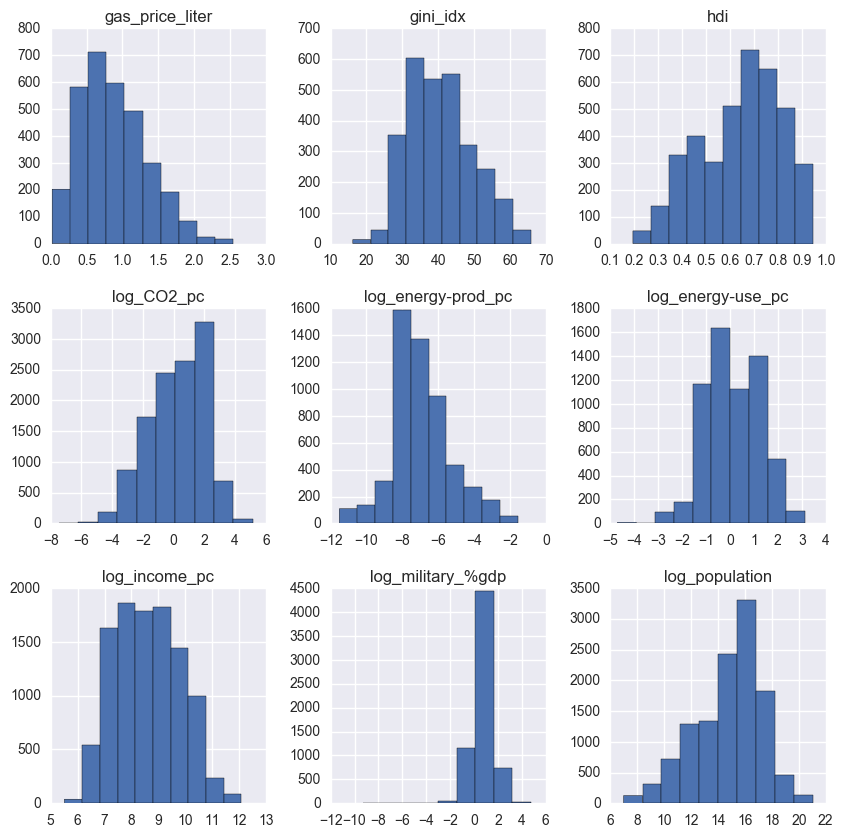

In [3060]:
# let's revisit the histograms once more
log_df_imputed.drop(['year'], axis=1)\
    .hist(figsize=(10,10), bins=10); 

The columns look at least _closer_ to normal.

In [3061]:
# have the correlations changed this time?
val = 'log_CO2_pc'
q = "year >= 1950"
corr_log_impute = log_df_imputed.query(q).drop('year', axis=1).corr().round(2)
corr_log_impute[val].sort_values()

gini_idx             -0.25
log_population       -0.11
gas_price_liter       0.01
log_military_%gdp     0.21
log_energy-prod_pc    0.55
log_energy-use_pc     0.89
hdi                   0.89
log_income_pc         0.89
log_CO2_pc            1.00
Name: log_CO2_pc, dtype: float64

Yes, indeed they've changed: `hdi` has increased, while the `log_energy-` variables are now weaker. `log_military_%gdp` is stronger but the correlation remains only weakly positive.

How do they correlate with each other?

#### Correlations & pairplots

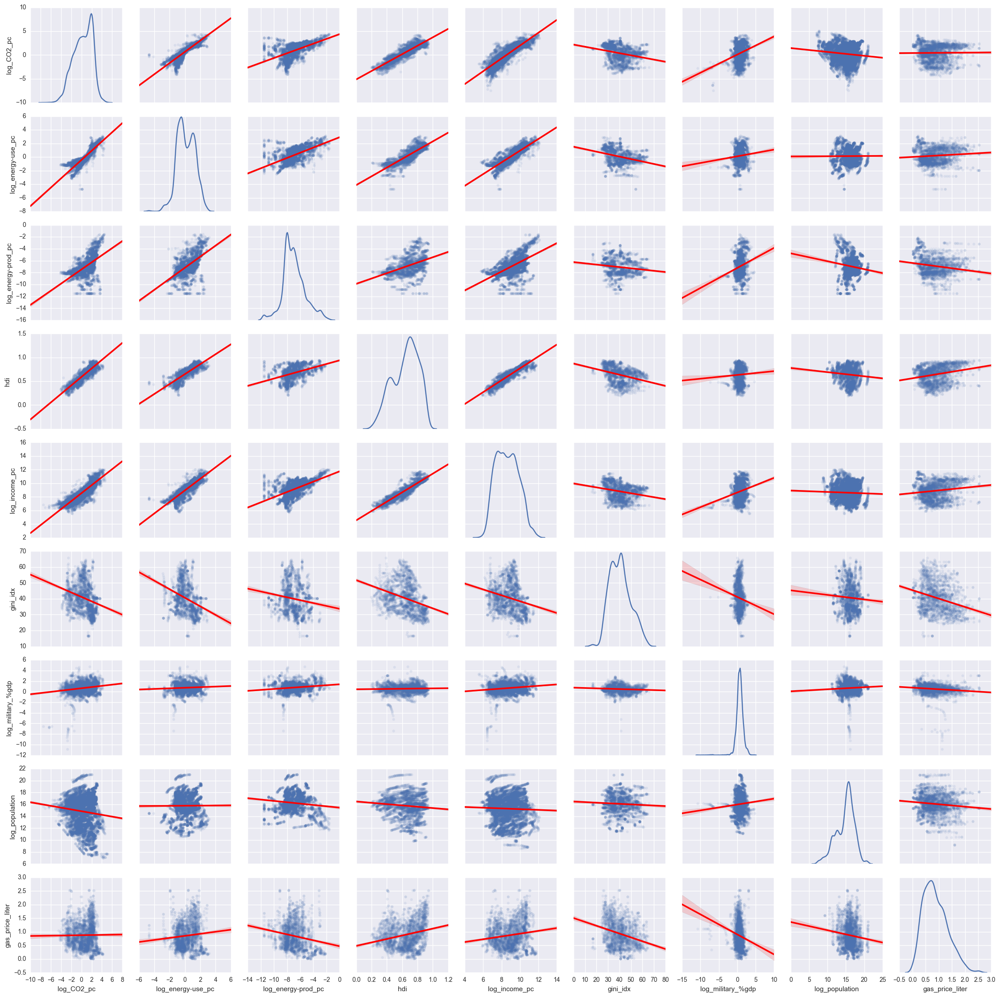

In [3062]:
# seaborn pairplot
plot_kws={'line_kws':{'color':'red'}, 'scatter_kws': {'alpha': 0.1}}

sns.pairplot(log_df_imputed.query(q).drop(['year'], axis=1), 
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

The most interesting thing here now is just how clear a relation there is between  `log_CO2_pc` and `hdi` increase. While it's close as well with `log_income_pc`, `hdi`'s is more symmetrical.

Aside from no real relevations beyond what we learned from looking at the correlation matrix.

Will faceting by region reveal anything interesting? 

In [3063]:
# first, plot only vars with high correlations
# with log_CO2_pc
val = 'log_CO2_pc'
q = "year >= 1990"

log_pp_df = log_df_imputed.query(q).set_index('region')\
    .drop('year', axis=1)\
    .reset_index()
    
# show CO2 correlations by region
log_pp_df.groupby('region').corr()[val].unstack(level=1).drop(val, axis=1)

,gas_price_liter,gini_idx,hdi,log_energy-prod_pc,log_energy-use_pc,log_income_pc,log_military_%gdp,log_population
region,,,,,,,,
Africa,-0.265825,0.139475,0.857341,0.517364,0.655046,0.902017,0.193459,-0.293505
Americas,-0.167691,-0.622201,0.828118,0.753898,0.927964,0.884117,0.307642,-0.346191
Asia,-0.172742,0.176868,0.846306,0.622016,0.946709,0.863917,0.354467,-0.262580
Europe,0.017823,-0.082301,0.481794,0.436374,0.819146,0.668811,0.054934,-0.001352
Oceania,0.051247,-0.667111,0.895145,0.980675,0.977510,0.914968,0.497799,0.006268


Europe's usually has the lowest correlation, while Oceania often has the highest, and these are extremely high, > .9. That's a bit suspect.

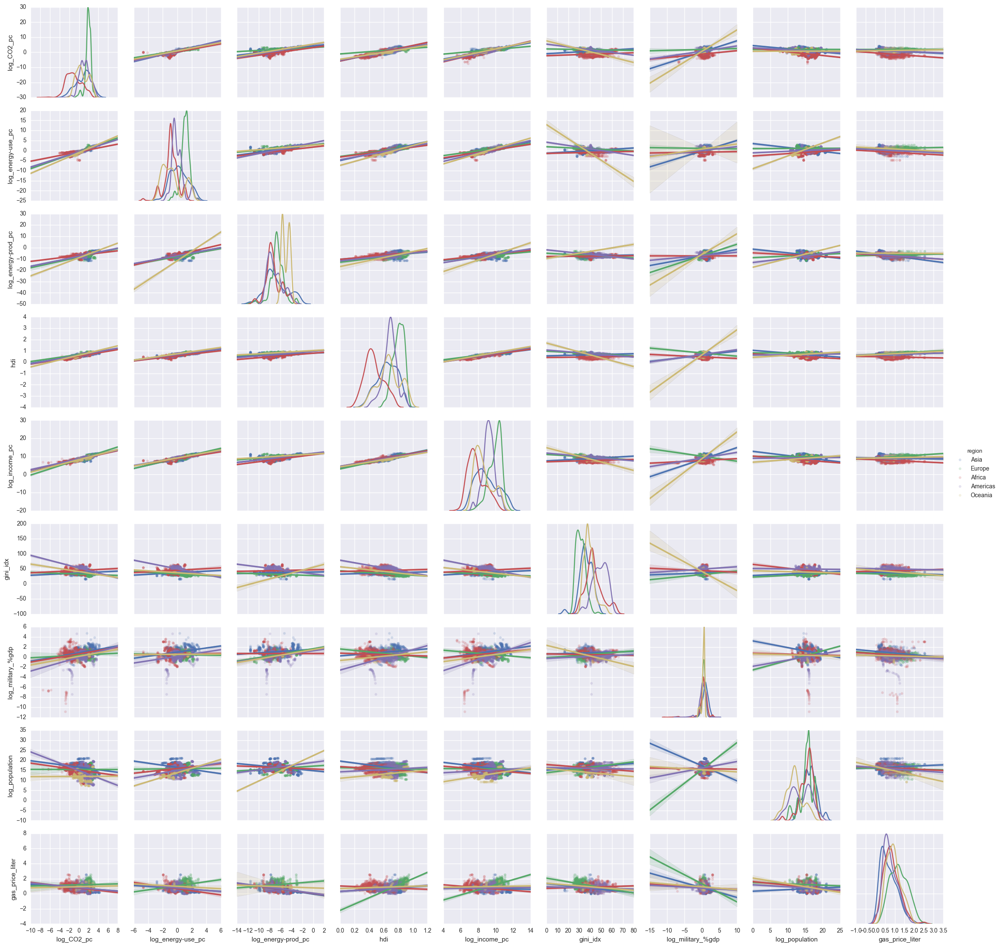

In [3064]:
# pairplot faceted by region
plot_kws={'scatter_kws': {'alpha': 0.2}} # set style
sns.pairplot(log_pp_df, hue='region', diag_kind='kde', kind='reg', plot_kws = plot_kws);

Breaking down by region, the main differences are in: 
* Europe, where the data tends to differ from global trends. This is unsurprising given the continent's historical advantage in trade and industrialization, and consequently standard of living.

* Oceania. However, I don't entirely trust Oceania's correlations because:
    * the population of countries for Oceania is less than half that of the other regions
    * its distribution of `CO2_pc`, even with a log transformation, is not normal.
    * its distribution of wealth, in terms of income and HDI, I suspect is highly unequal. It seems to be essentially concentrated in the sub-region 'Australia & New Zealand' (and most likely Australia specifically). 
    
* Americas, which like Oceania I wonder if regional correlations are overly influenced by the US.

** Ultimately, comparing regions is like comparing apples to oranges**

With the exception of Europe, there is so much variation in the distribution of countries within regions and sub-regions that it's hard to draw broad conclusions. 

Every region has a 'gorilla' country (such as the United States, Russia and China), with local or very high values across multiple variables, The best example may be Australia's outsize influence resulting in extremely high correlations for Oceania.

More interesting would be to find other groups for comparison, and use the regions as a secondary categorical variable.


## Carbon footprints

Almost all the variables we've been looking at are per capita. It's all too easy to get a false sense of improvement when you see the slowdown in the CO2_pc growth in recent years, at least among the industrial powerhouses. 

It's time to step back and look once more at the overall picture. We can get a basic idea of carbon footprint simply by multiplying `population` by `CO2_pc`.

*NOTE: While I refer to this calculation as `CO2_footprint` for this analysis, a true measurement of carbon footprint includes other emissions besides CO2.*

So who has the biggest carbon footprint these days? China? The US? Let's see.

### Data cleansing

To prevent errors in the bubble chart, I need to convert `population` to integer. However, to do that I first need to convert any NaNs to 0.

In [3079]:
# convert population to int
# to enable bubble plots later on

df_imputed['population'] = df_imputed['population'].fillna(0).astype(int)

# now create footprint column
df_imputed['CO2footprint'] =  df_imputed['CO2_pc'].multiply(df_imputed['population'])

### Global footprint evolution

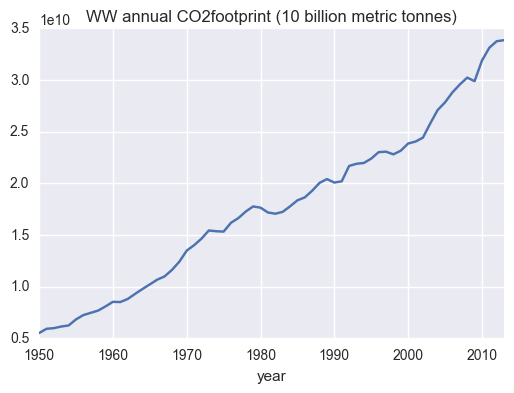

In [3074]:
# What does the global trend line look like?
kind = 'WW annual'
val = 'CO2footprint'
unit = '(10 billion metric tonnes)'

annual_totals = df_imputed.groupby('year').sum()[val]
annual_totals.plot()
plt.title(" ".join([kind, val, unit]));

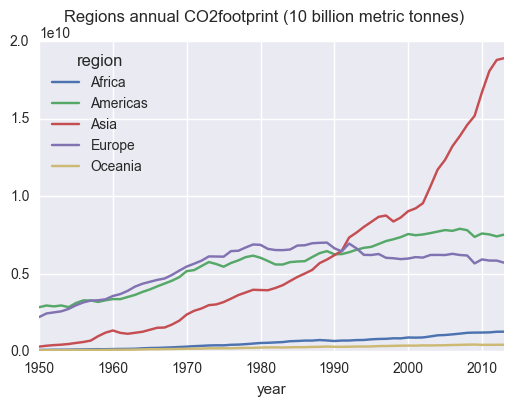

In [3075]:
# regional timeseries
kind = 'Regions annual'
val = 'CO2footprint'
unit = '(10 billion metric tonnes)'

annual_totals = df_imputed.groupby(['region','year']).sum()[val]
annual_totals.unstack(level=0).loc[1950:].plot()
plt.suptitle(" ".join([kind, val, unit]));

1990 was an inflection point for both Asia and Europe's carbon footprints, where the former began to exceed the latter. Shortly afterwards, Asia's footprint began skyrocketing, while Europe's began a gradual downward trajectory.

How have footprints changed evolved during this time?

### 1990 vs 2013 bubble plots

In [3076]:
# what did this look like a few decades earlier?
yr = 1990
q = "year==@yr"
val = 'CO2_pc'
size = 'CO2footprint'
x = 'population'
df_imputed.query(q).iplot(kind='bubble', x=x, y=val, size=size, text='country',\
           xTitle= x + " (log scale)", yTitle=val, categories='region', logx=True,\
             title='Who had the biggest %s in %s?' % (size, yr))

In [3077]:
# Who had the biggest footprint in 1990?

df_imputed[['country','CO2_pc', 'population', 'CO2footprint']].loc[df_imputed.query(q)['CO2footprint'].idxmax()]

country         United States
CO2_pc                19.0752
population        2.52848e+08
CO2footprint      4.82312e+09
Name: 11423, dtype: object

In [3081]:
# show in bubble plot for most recent year
max_yr = df_imputed['year'].max()
yr = max_yr
q = "year==@max_yr"
df_imputed.query(q).iplot(kind='bubble', x=x, y=val, size=size, text= 'country',\
           xTitle= x + " (log scale)", yTitle=val, categories='region', logx=True,\
             title='Who had the biggest %s in %s?' % (size, yr))

In [3082]:
# who has biggest footprint now?
df_imputed[['country','CO2_pc', 'population', 'CO2footprint']].loc[df_imputed.query(q)['CO2footprint'].idxmax()]

country               China
CO2_pc              7.52178
population       1362514260
CO2footprint    1.02485e+10
Name: 2209, dtype: object

### Increasing vs decreasing footprints

Between 1990 & 2013, which countries saw their footprint grow, and which saw it shrink?

In [3083]:
# change from 1990 to 2013 by country
q = "year == 1990 | year == 2013"
val = 'CO2footprint'
footprint_df = df_imputed.query(q).set_index(['year', 'country']).drop(['region', 'sub-region'], axis=1)[val]
footprint_df = footprint_df.unstack()
footprint_df

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua And Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wallis Et Futuna,Yemen,Yugoslavia,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1990,2.614318e+06,5.309325e+06,7.793506e+07,NaN,5.115037e+06,NaN,300666.91798,1.126034e+08,NaN,1.730666e+06,...,3.993006e+06,NaN,65999.5133,1.221512e+08,2.140622e+07,NaN,9.595672e+06,1.337910e+08,2.445630e+06,1.550268e+07
2013,2.126665e+07,4.814330e+06,1.342036e+08,419453.4275,3.246099e+07,120066.375,524333.59650,1.898012e+08,5.496328e+06,8.763332e+05,...,7.604678e+06,1.032168e+08,106334.3633,1.855150e+08,1.526107e+08,22011.6125,2.534402e+07,NaN,3.824328e+06,1.377939e+07


In [ ]:
# Helper functions

def topN_change(df, row, chg, n=5):
    '''Calculates difference between specified row & 
    previous row, returning highest N results'''

    if chg == 'diff':
        return df.diff().round(2).loc[row]\
        .dropna().sort_values(ascending=False).head(n)
        
    elif chg == 'pct':
        return df.pct_change().multiply(100).round(2).loc[row]\
        .dropna().sort_values(ascending=False)\
        .head(n)
        
    else:
        "Unrecognized function type for 'chg'. Specify 'diff' or 'pct'."
        
def bottomN_change(df, row, chg, n=5):
    '''Calculates difference between specified row & 
    previous row, returning lowest N results'''
    
    if chg == 'diff':
        return df.diff().round(2).loc[row]\
        .dropna().sort_values().head(n)
    elif chg == 'pct':
        return df.pct_change().multiply(100).round(2).loc[row]\
        .dropna().sort_values()\
        .head(n)
    else:
        "Unrecognized function type for 'chg'. Specify 'diff' or 'pct'."

In [3084]:
# which countries had the biggest % incr
top5 = topN_change(footprint_df, 2013, 'pct')
top5

country
Namibia              7207.84
Equatorial Guinea    4372.68
Somalia              3300.37
Nepal                 924.76
Lao                   922.52
Name: 2013, dtype: float64

#### Sanity check!
These increases are insane.

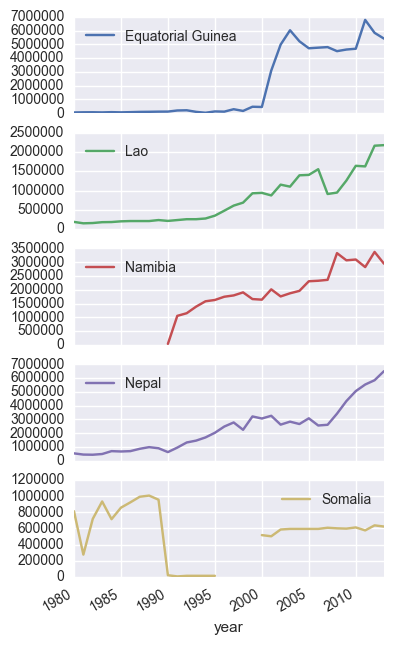

In [3086]:
# sanity check
q = "year >= 1980 & country in @top5.index"
df_imputed.query(q).set_index(['country', 'year'])['CO2footprint'].unstack(level=0)\
    .plot(subplots=True, figsize=(4,8));

In [3087]:
# why is Somalia is still missing data?
q = "country == 'Somalia' & year >= 1995 & year <=2001"
df_imputed.query(q)

,country,region,sub-region,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint
9636,Somalia,Africa,Eastern Africa,1995,0.00173,NaN,NaN,NaN,637.0,NaN,0.001077,6346440,NaN,10979.34120
9637,Somalia,Africa,Eastern Africa,2000,0.07000,NaN,NaN,NaN,603.0,NaN,0.001002,7385416,NaN,516979.12000
9638,Somalia,Africa,Eastern Africa,2001,0.06601,NaN,NaN,NaN,603.0,NaN,0.000926,7610053,NaN,502339.59853


Ah, Somalia is actually missing rows for those years. This is odd. But since we are concerned with only 1990 & 2013 here, I'll leave this as-is for now.

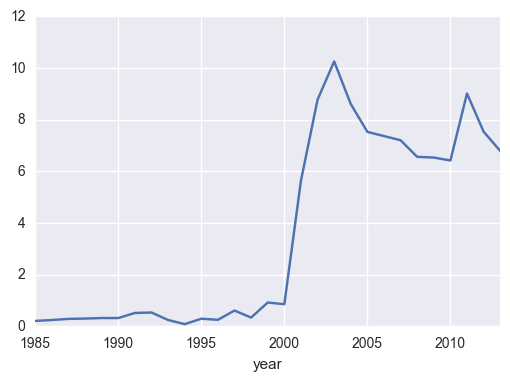

In [3088]:
# Equatorial Guinea?
q = "country == 'Equatorial Guinea' & year >= 1985"
df_imputed.query(q).set_index('year')['CO2_pc'].plot()

Seems oil reserves were discovered in 1995. 
https://en.wikipedia.org/wiki/Energy_in_Equatorial_Guinea#Oil

In [3089]:
# What about Namibia's strange spike?

q = "country == 'Namibia' & year >= 1988 & year <=1995"
df_imputed.query(q)

,country,region,sub-region,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint
7340,Namibia,Africa,Southern Africa,1990,0.02850,NaN,NaN,0.578,5720.0,NaN,NaN,1415447,NaN,4.034024e+04
7341,Namibia,Africa,Southern Africa,1991,0.72025,0.426335,0.00015,0.581,5970.0,NaN,4.81,1466152,0.460000,1.055996e+06
7342,Namibia,Africa,Southern Africa,1992,0.76061,0.443711,0.00014,0.586,6200.0,NaN,3.61,1513689,0.420000,1.151327e+06
7343,Namibia,Africa,Southern Africa,1993,0.89111,0.471797,0.00013,0.588,5920.0,NaN,2.18,1559480,0.413333,1.389668e+06
7344,Namibia,Africa,Southern Africa,1994,0.98641,0.498510,0.00012,0.590,5850.0,NaN,1.57,1605828,0.406667,1.584005e+06
7345,Namibia,Africa,Southern Africa,1995,0.98637,0.535911,0.00015,0.587,5900.0,NaN,1.73,1654214,0.400000,1.631667e+06


Ah hah. Namibia's data for both `population` and `CO2_pc` only starts in 1990. While the curve for the former looks reasonable, the latter's initial steep rise followed by a long plateau is suspect. It will be better to set this to NaN, so that Namibia is **not** included in the '1990-2013 % changes' data frame later on in this analysis.

Also, Equitorial Guinea and Somalia have very erratic `CO2_pc` curves. However, I saw the same fluctuating lines when I looked online:

* [Somalia](https://tradingeconomics.com/somalia/co2-emissions-metric-tons-per-capita-wb-data.html)
* [Equatorial Guinea](https://tradingeconomics.com/equatorial-guinea/co2-emissions-metric-tons-per-capita-wb-data.html)

In [3090]:
# any other countries with data only starting in 1990?
df.groupby('country')['year','CO2_pc'].min().query("year == 1990")

,year,CO2_pc
country,,
Marshall Islands,1990,1.00801
Namibia,1990,0.02850


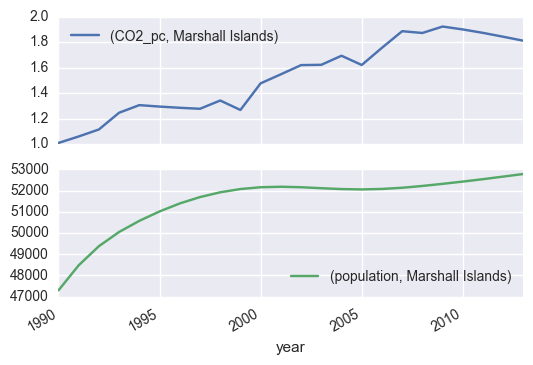

In [3091]:
# another sanity check
q = "year >= 1980 & country == 'Marshall Islands'"
vals = ['CO2_pc', 'population']
df_imputed.query(q).set_index(['country', 'year'])[vals].unstack(level=0)\
    .plot(subplots=True);

These curves look more reasonable. Just need to fix Namibia and update footprint_df.

#### Fix Namibia & update df

This analysis is focused by `CO2_pc`, and to create the dataset this column was the "driving" column: there should be no null `CO2_pc` values here. Since Namibia's is suspect for 1990, let's drop the entire row.

In [3092]:
# get location
idx = df_imputed.loc[df_imputed['country']=='Namibia'].loc[df_imputed['year']==1990].index
df_imputed.drop(idx, inplace=True)

In [3093]:
# verify
df_imputed.loc[df_imputed['country']=='Namibia'].loc[df_imputed['year']==1990]

,country,region,sub-region,year,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint


In [3094]:
# recreate footprint df
q = "year == 1990 | year == 2013"
val = 'CO2footprint'
footprint_df = df_imputed.query(q).set_index(['year', 'country']).drop(['region', 'sub-region'], axis=1)[val]
footprint_df = footprint_df.unstack()

#### Resume analysis

In [3095]:
# biggest % increase
topN_change(footprint_df, 2013, 'pct')

country
Equatorial Guinea    4372.68
Somalia              3300.37
Nepal                 924.76
Lao                   922.52
Benin                 719.15
Name: 2013, dtype: float64

In [3096]:
# biggest % decrease?
bottomN_change(footprint_df, 2013, 'pct')

country
North Korea   -77.65
Nauru         -65.76
Romania       -55.47
Aruba         -49.36
Bulgaria      -47.78
Name: 2013, dtype: float64

In [3097]:
# The biggest absolute incr?
topN_change(footprint_df, 2013, 'diff')

country
China            7.788010e+09
India            1.415467e+09
Iran             4.059290e+08
United States    3.625781e+08
South Korea      3.455244e+08
Name: 2013, dtype: float64

In [3099]:
# what % is the 2013 footprint for top5_incr
# compared to world total?

q = "year == 2013"
val = 'CO2footprint'
ww_footprint = df_imputed.query(q)[val].sum()
ww_footprint.round(0)

33853051311.0

In [3100]:
# top5 totals for final year in df
q = "year == 2013 & country in @top5_incr"

footprints = df_imputed.query(q)[['country', val]]

pct_total = footprints[['country', val]][val]\
    .divide(ww_footprint).multiply(100)\
    .rename('% of Total')
    
pd.concat([footprints, pct_total], axis=1).sort_values('% of Total')

,country,CO2footprint,% of Total
9778,South Korea,5.924451e+08,1.750049
5249,Iran,6.169202e+08,1.822347
5121,India,2.034570e+09,6.010003
11446,United States,5.185696e+09,15.318252
2209,China,1.024853e+10,30.273586


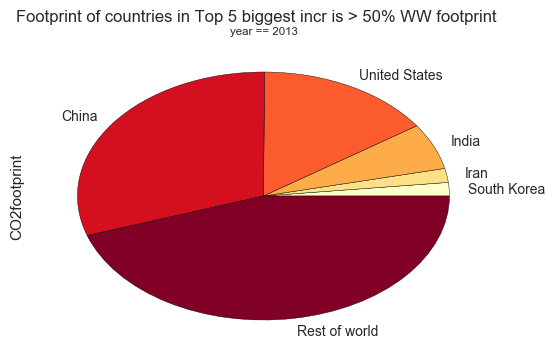

In [3103]:
# can we visualize this?

q = "year == 2013"
bigfoot_bool = df_imputed.query(q)['country']\
    .apply(lambda x: x if x in top5_incr else 'Rest of world')\
    .rename('label')
    
footprint_by_label = pd.concat([df_imputed.query(q)[['country', 'CO2footprint']], bigfoot_bool], axis=1)\
    .groupby('label').sum()
    
footprint_by_label[val].sort_values().plot(kind='pie', colormap='YlOrRd')
plt.suptitle("Footprint of countries in Top 5 biggest incr is > 50% WW footprint")
plt.title(q, fontsize='x-small');


In [3104]:
# and the biggest absolute decr?
bottomN_change(footprint_df, 2013, 'diff')

country
Russia           -5.401862e+08
Germany          -2.563956e+08
North Korea      -1.740604e+08
United Kingdom   -9.844260e+07
Romania          -8.811719e+07
Name: 2013, dtype: float64

In [3105]:
# How many countries saw in incr in CO2 footprint between 1990 & 2013?
footprint_chg = footprint_df.pct_change().multiply(100).loc[2013]
footprint_chg.where(footprint_chg > 0).count()

154

In [3106]:
# how many saw a decrease?
footprint_chg.where(footprint_chg <= 0).count()

29

This is depressing.

But are there distinctive patterns of top-growing footprint countries vs the top-shrinking ones?

## Compare countries with incr vs decr footprints

Are there any discernible differences between these two groups?

In [3107]:
# compare incr vs decr footprint countries
countries_incr = footprint_chg.where(footprint_chg > 0).dropna().index.values
countries_decr = footprint_chg.where(footprint_chg <= 0).dropna().index.values

In [3108]:
# add label col
trend_bool = create_member_labs(df_imputed['country'], 
                                group = countries_incr, 
                                true_lab = 'incr', 
                                false_lab = 'decr')
# append to df
df_compare = append_col(df_imputed, trend_bool)

In [3109]:
# compare means for incr vs decr
q = "year >=  2013"
df_compare.query(q).drop('year', axis=1).groupby('incr_or_decr').median().round(2)

,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint
incr_or_decr,,,,,,,,,,
decr,4.93,2.14,0.0,0.79,16000.0,32.4,1.50,4998824.0,1.76,12638989.92
incr,2.45,0.91,0.0,0.69,8760.0,41.0,1.54,7046324.5,1.28,6656873.50


In a nutshell, `decr` is made up of countries with a better standard of living. The only areas where it has the lower mean is for inequality (`gini_idx`) and `military_%gdp`. 

### Correlations & pairplot comparisions

To compare these, better to use log values for the negative-skewed variables.

In [3110]:
# create a log-value comparison df
log_df_compare = append_col(log_df_imputed, trend_bool)

In [3134]:
# correlations
q = "year >= 1990"
val = 'log_CO2_pc'
log_df_compare.query(q).groupby('incr_or_decr').corr()[val].unstack(level=0)

incr_or_decr,decr,incr
gas_price_liter,0.057156,-0.088930
gini_idx,-0.278951,-0.065590
hdi,0.795744,0.898584
log_CO2_pc,1.000000,1.000000
log_energy-prod_pc,0.657766,0.549484
log_energy-use_pc,0.814322,0.911234
log_income_pc,0.780808,0.942134
log_military_%gdp,-0.099605,0.236437
log_population,-0.126185,-0.213595
year,-0.098701,0.088252


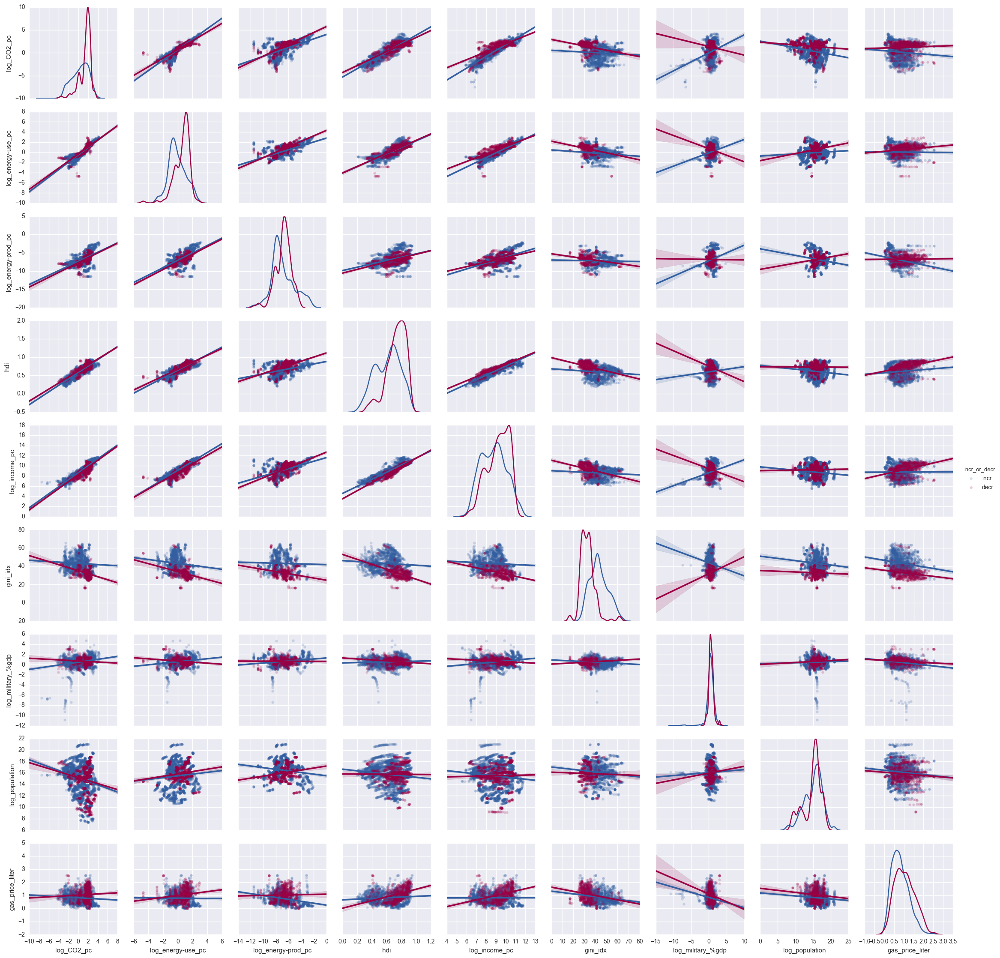

In [3135]:
# pairplots for same time period
plot_kws={'scatter_kws': {'alpha': 0.2}} # set style
palette=dict(incr='#335fa1', decr='#9b0044');

sns.pairplot(log_df_compare.query(q).drop('year', axis=1),
             hue='incr_or_decr', diag_kind='kde', kind='reg', plot_kws = plot_kws, palette=palette);


The cleanest correlations for both groups seems to be `hdi` (and `log_income_pc`, which is a major component of hdi score).

However what's really interesting when looking at faceted pairplots is seeing where trends diverge or clusters form.

There are both, at least for the `decr` group for `gini_idx`, `log_military_%gdp`, and `gas_price_liter`. However these are also in noisy scatterplots for columns with a lot of imputed values. 


### Heatmap of % change for all variables

So far we have been comparing annual values for both groups. Now I'd like to know how has each of these variables changed between 1990 & 2013, and whether it differs between the `incr` and `decr` groups.

Also, how does this vary from country to country within each group?

The best way I know to answer these questions is to make a heatmap of percentage changes.

In [3113]:
## Helper function
def create_member_labs(series, group, true_lab, false_lab):
    member_labs = series.apply(lambda x: true_lab if x in group else false_lab)\
    .rename(true_lab + "_or_" + false_lab)
    return member_labs

def append_col(df, col):
    new_df =pd.concat([df, col], axis=1)
    return new_df

In [3114]:
# calculate % change between start & end years
# for all numeric columns
start = 1990
end = 2013
q = "year==@start | year ==@end"

# calc % change for each col, by country
changes_df = df_imputed.set_index(['country','year']).query(q).groupby(['country'])\
    .transform(lambda x: x.pct_change().multiply(100).round(2))\
    .dropna(how='all').reset_index()\
    .drop('year', axis=1)
    
changes_df.head()

,country,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint
0,Afghanistan,219.94,NaN,NaN,61.36,74.04,NaN,-51.91,154.26,NaN,713.47
1,Albania,3.20,-20.21,-47.30,19.84,130.26,NaN,-76.06,-12.13,NaN,-9.32
2,Algeria,16.85,29.76,10.10,28.42,30.39,-28.87,231.51,47.37,NaN,72.20
3,Angola,201.17,25.87,96.39,NaN,41.00,NaN,-68.72,110.72,NaN,534.62
4,Antigua And Barbuda,19.97,6.93,NaN,NaN,15.24,NaN,NaN,45.36,NaN,74.39


In [3115]:
# create category column to label if country is in incr & decr group
trend_bool = create_member_labs(changes_df['country'], 
                                group = countries_incr, 
                                true_lab = 'incr', 
                                false_lab = 'decr')

# append column to df
changes_df = append_col(changes_df, trend_bool)
changes_df.head()

,country,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint,incr_or_decr
0,Afghanistan,219.94,NaN,NaN,61.36,74.04,NaN,-51.91,154.26,NaN,713.47,incr
1,Albania,3.20,-20.21,-47.30,19.84,130.26,NaN,-76.06,-12.13,NaN,-9.32,decr
2,Algeria,16.85,29.76,10.10,28.42,30.39,-28.87,231.51,47.37,NaN,72.20,incr
3,Angola,201.17,25.87,96.39,NaN,41.00,NaN,-68.72,110.72,NaN,534.62,incr
4,Antigua And Barbuda,19.97,6.93,NaN,NaN,15.24,NaN,NaN,45.36,NaN,74.39,incr


Some columns have very large ranges, so we'll need to normalize the dataframe. And since looking at both negative and postive change, we'll be normalizing around 0, with a range of `(-1,1)`.

In [3116]:
# why normalization is needed
changes_df.groupby('incr_or_decr').agg(['min', 'max'])

country           CO2_pc         energy-use_pc          \
                      min       max    min     max           min     max   
incr_or_decr                                                               
decr              Albania  Zimbabwe -81.87     3.2        -53.85  119.42   
incr          Afghanistan    Zambia -46.36  2017.5        -41.72  348.94   

             energy-prod_pc           hdi           ...    gini_idx         \
                        min     max   min     max   ...         min    max   
incr_or_decr                                        ...                      
decr                  -47.3  160.47 -0.20   19.84   ...       22.45  22.45   
incr                  -60.1  700.00 -1.28  100.00   ...      -28.87  39.03   

             military_%gdp         population         gas_price_liter      \
                       min     max        min     max             min max   
incr_or_decr                                                                
decr                -76.06  134.22     -17.78  119.62             NaN NaN   
incr                -99.34  231.51     -52.83  399.04             NaN NaN   

             CO2footprint           
                      min      max  
incr_or_decr                        
decr               -77.65    -1.47  
incr                 0.01  4372.68  

[2 rows x 22 columns]

In [3117]:
## helper functions

def norm_pos_neg(df):
    '''normalize positive & negative values 
    between (1,-1)'''
    str_df = df.select_dtypes(exclude='number')
    num_df = df.select_dtypes(include='number')
    mins = abs(num_df.min())
    maxes = num_df.max()
    neg = num_df.mask(num_df > 0).div(mins) # create df of normalized neg've values
    pos = num_df.mask(num_df < 0).div(maxes) # create df of normalized pos'iti've values
    combo_df = pos.fillna(neg)
    return append_col(combo_df, str_df)


def sort_cols_by_corr(df, val):
    '''returns columns in order from highest to lowest
    correlation with val, for sorting index (y-axis) of heatmap.'''
    sort_order = df.corr()[val].sort_values().index.values
    return sort_order

def shorten_colnames(df):
    '''shortens column names to first word, 
    assuming underscore (_) separates words.'''
    cols = df.columns
    newcols = pd.Series(cols).apply(str.split, args=('_')).apply(lambda x: x[0])
    newcols_dict = pd.Series(index=cols, data=newcols.values)\
        .to_dict()
    return newcols_dict

def plotly_heatmap(df, title, val, colors = 'Spectral'):
    '''select numeric cols from df, sort x-axis by val, 
    & shorten names for legibility then plot.'''
    df = df.select_dtypes('number')
    
    # get new names & sort order for cols
    sort_order = sort_cols_by_corr(df, val)
    shortnames = shorten_colnames(df)
    
    # make df more legible for plot
    df = df.reindex(sort_order, axis=1)\
    .sort_values(val)\
    .dropna(how='all', axis=1)\
    .rename(columns=shortnames)
    
    df.iplot(
        kind='heatmap', 
        colorscale=colors, 
        title=title
    )

In [3136]:
# plot heatmap with normalized values
val = 'CO2footprint'
title = "Pct changes (normalized) %d-%d, sort by %s" % (start, end, val)
hm_df = norm_pos_neg(changes_df) # normalize each column around 0.

plotly_heatmap(hm_df.set_index('country'), title, val)

* The most extreme increases & decreases in `CO2footprint` are driven more from spikes & falls in `CO2_pc` than `population`.

* All countries with decreasing `CO2footprint` had decreasing `CO2_pc`. The reverse is not true.

* There is an interesting divergence between `income_pc` & `hdi`, even though the latter is partly derived from the former. While `income_pc`'s correlation with `CO2_pc` seems driven by extremes at each end, `hdi`'s correlation is a steady continuum. This echoes what we saw earlier in the  `log_CO2_pc` vs `hdi` pairplot.

* `hdi` seems to be growing more slowly for decreasing and borderline-increasing countries. The same applies to `population`.

* Changes in `CO2_pc` generally correlate more with changes in `energy-use_pc` than population.

* Lastly, for decreasing-footprint countries side, the only extreme values are negative (-1), and only for the top 4 columns (rows in the heatmap). Otherwise the colours are slightly more muted, i.e. mid-range.

#### Compare the stats

In [3119]:
# normalized median %changes (normalized)
hm_df.groupby('incr_or_decr').median().round(2)

,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint
incr_or_decr,,,,,,,,,,
decr,-0.33,-0.17,-0.09,0.14,0.01,0.58,-0.42,0.02,NaN,-0.23
incr,0.03,0.07,0.02,0.20,0.02,-0.17,-0.41,0.12,NaN,0.03


In [3120]:
# actual median %changes
changes_df.groupby('incr_or_decr').median().round(2)

,CO2_pc,energy-use_pc,energy-prod_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint
incr_or_decr,,,,,,,,,,
decr,-26.79,-9.32,-5.28,14.08,33.70,22.45,-41.57,9.35,NaN,-17.71
incr,56.56,23.62,12.81,20.14,48.59,-4.94,-40.62,48.58,NaN,141.60


The biggest divergences are in `CO2_pc`, `energy-use_pc` and `gini_idx`. In general, absolute % changes were usually higher in the increasing-footprint countries, and they were positive except for military spending.

#### Regional breakdowns

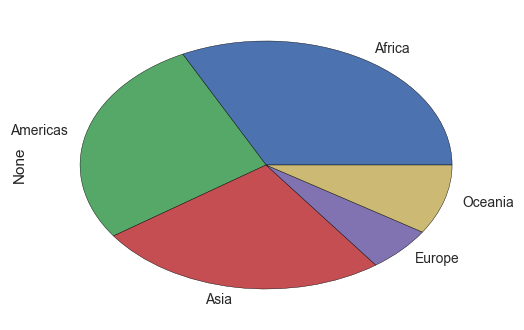

In [3122]:
#What is the regional breakdown 
# for increasing-footprint group?
q = 'country in @countries_incr & year >= 1990'

df_imputed.query(q).groupby(['region']).size().plot(kind='pie');

In [3123]:
df_imputed.query(q).groupby(['region'])['country'].nunique()

region
Africa      50
Americas    42
Asia        39
Europe       9
Oceania     14
Name: country, dtype: int64

In [3124]:
# which European countries STILL have increasing
# co2 footprints?!

q = "country in @countries_incr & region == 'Europe' & year >= 1990"

df_imputed.query(q).groupby(['region', 'country']).size()

region  country    
Europe  Austria        24
        Gibraltar      24
        Ireland        24
        Luxembourg     24
        Malta          24
        Netherlands    24
        Norway         24
        Portugal       24
        Spain          24
dtype: int64

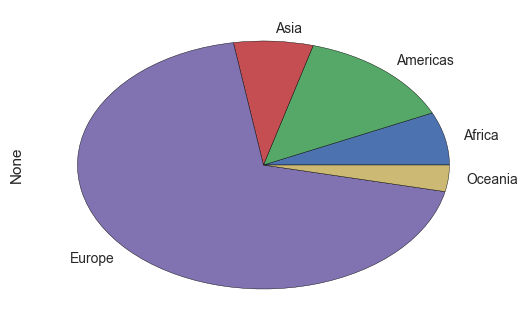

In [3125]:
# Regional breakdown for decreasing-footprint group
q = 'country in @countries_decr & year >= 1990'
df_imputed.query(q).groupby(['region']).size().plot(kind='pie');

In [3126]:
df_imputed.query(q).groupby(['region'])['country'].nunique()

region
Africa       2
Americas     4
Asia         2
Europe      20
Oceania      1
Name: country, dtype: int64

In [3127]:
# show countries with descreasing footprint that are 
# actually NOT in Europe
q = "country in @countries_decr & region != 'Europe' & year >= 1990"

df_imputed.query(q).groupby(['region', 'country']).size()

region    country              
Africa    Congo Dem Rep            24
          Zimbabwe                 24
Americas  Aruba                    24
          Bermuda                  24
          French Guiana            24
          St Pierre Et Miquelon    24
Asia      North Korea              24
          Syria                    24
Oceania   Nauru                    24
dtype: int64

## Conclusions

The good news is there are 29 countries who have managed to decrease their CO2 footprint between 1990 & 2013. The vast majority of them are in Europe.

Looking at the heatmap and comparing their median values, these decreasing-footprint countries seem less volatile, in that their rates of change *for non-energy or income variables* are more moderate than the increasing group, both positive and negative.

While income, population and HDI increased for both groups, it was at a far slower pace for the decreasing-footprint countries. This leads to not just to the correlation or causation question, but also the question of which came first?

Some might want to claim the efforts to reduce CO2 created economic stagnation, resulting in slower growth for HDI, income, and population. 

Given most of the reductions are occuring in Europe, my hypothesis is the region already has achieved a high standard of living and security, so these countries have the wherewithal to more aggressively tackle the seemingly more "abstract" problem of CO2 emissions. 

**What else I've learned along the way:**

* Despite big progress in decreasing `CO2_pc`, Europe still leads the world...for now. Asia and the Americas are rapidly catching up.

* Percentage-wise, CO2 emissions in Africa are growing the fastest but this is virtually invisible when compared to other regions.

* China's CO2 emission increases were nearly vertical in the 2000s, so with its population it has overtaken the US in terms of CO2 footprint.

* Tiny countries tend to have gigantic `CO2_pc`.


**Ideas for further exploration:**

* dig deeper in the clusters and diverging trendlines between increasing and decreasing footprints for the lower-correlating variables like `gini_idx`. 

* determine how much of Europe's declining CO2 rates were due to Phase 1 Kyoto targets (higher for the EU than elsewhere), and how much were due to the fallout from the 2008 financial crisis, as they both in effect from 2008 to 2012?

* on a similar note, were there any countries that saw increasing income_pc or hdi while also experiencing decreasing CO2_pc?
